In [1]:
# This is the import cell
import sys
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.lines import Line2D
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
from mpl_toolkits.axes_grid1.inset_locator import (inset_axes, InsetPosition,
                                                  mark_inset)
import matplotlib.ticker as ticker
from collections import OrderedDict
from scipy import stats
from PIL import Image
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches
import pylab as plot
first = True
pd.set_option('display.max_columns', None)
pd.set_option("display.max_rows", 10)



# Here are my rc parameters for matplotlibf
fsize = 20
mpl.rc('font', serif='Helvetica Neue')
#mpl.rc('font', serif='Times New Roman')
mpl.rcParams.update({'font.size': fsize})
mpl.rcParams['figure.figsize'] = 3.2, 2.8
mpl.rcParams['figure.dpi'] = 500
mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'
mpl.rcParams['lines.linewidth'] = 1.5
mpl.rcParams['axes.linewidth'] = 1.5
# Set x tick params
mpl.rcParams['xtick.major.size'] = 4.5
mpl.rcParams['xtick.major.width'] = 1.5
mpl.rcParams['xtick.minor.size'] = 3.
mpl.rcParams['xtick.minor.width'] = 1.25
# Set y tick params
mpl.rcParams['ytick.major.size'] = 4.5
mpl.rcParams['ytick.major.width'] = 1.5
mpl.rcParams['ytick.minor.size'] = 3.
mpl.rcParams['ytick.minor.width'] = 1.25
mpl.rcParams['legend.fontsize']= 20.
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams["font.family"] = "Times New Roman"
# Load LaTeX and amsmath
# mpl.rc('text', usetex=True)
# mpl.rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]

In [2]:
# Get the current path
if first:
    parent = os.getcwd()
os.chdir(parent)

# Grab file names from data folder
dens = os.listdir('../../../../txt_files/fast_out_txt_files/Align_press_CoM')
try:
    data.remove('.DS_Store')
except:
    print(".DS_Store not in directory")
    
# Grab the MCS data
pres = os.listdir('../../../../txt_files/fast_out_txt_files/Interpart_press')
try:
    pres.remove('.DS_Store')
except:
    print(".DS_Store not in directory")
    
# Grab the MCS data
pres2 = os.listdir('../../../../txt_files/fast_out_txt_files/PhaseComp')
try:
    pres.remove('.DS_Store')
except:
    print(".DS_Store not in directory")
    
# Grab the MCS data
pres3 = os.listdir('../../../../txt_files/fast_out_txt_files/lat')
try:
    pres.remove('.DS_Store')
except:
    print(".DS_Store not in directory")
    
# Grab the MCS data
pres4 = os.listdir('../../../../txt_files/fast_out_txt_files/BubComp')
try:
    pres.remove('.DS_Store')
except:
    print(".DS_Store not in directory")
    

.DS_Store not in directory
.DS_Store not in directory
.DS_Store not in directory
.DS_Store not in directory
.DS_Store not in directory


In [3]:
# Some functions to get the relevant data from the filenames
def checkFile(fname, string):
    for i in range(len(fname)):
        if fname[i] == string[0]:
#             print"{} matches {}".format(fname[i], string[0])
            for j in range(1, len(string)):
                if (i + j) > (len(fname) - 1):
                    break
                elif fname[i + j] == string[j]:
#                     print"{} matches {}".format(fname[i+j], string[j])
                    if j == (len(string) - 1):
#                         print"Final match!"
                        return True
                else:
                    break
    return False
    
def txtValue(fname, string):
    out = ""
    index = 0
    for i in range(len(fname)):
        if fname[i] == string[0]:
            for j in range(1, len(string)):
                if (i + j) > (len(fname) - 1):
                    break
                elif fname[i + j] == string[j]:
                    if j == (len(string) - 1):
                        # Last index of search string
                        index = i + j
                else:
                    break
                        
    # First index of value
    index += 1
    mybool = True
    while mybool:
        if fname[index].isdigit():
            out = out + fname[index]
            index += 1
        elif fname[index] == ".":    
            if fname[index+1].isdigit():
                out = out + fname[index]
                index += 1
            else:
                mybool = False
        else:
            mybool = False
    return float(out)

# Sorting functions
def multiSort(arr1, arr2, arr3, arr4):
    """Sort an array the slow (but certain) way, returns original indices in sorted order"""
    # Doing this for PeR, PeS, xS in this case
    cpy1 = np.copy(arr1)
    cpy2 = np.copy(arr2)
    cpy3 = np.copy(arr3)
    cpy4 = np.copy(arr4)
    ind = np.arange(0, len(arr1))
    for i in range(len(cpy1)):
        for j in range(len(cpy1)):
            # Sort by first variable
            if cpy1[i] > cpy1[j] and i < j:
                # Swap copy array values
                cpy1[i], cpy1[j] = cpy1[j], cpy1[i]
                cpy2[i], cpy2[j] = cpy2[j], cpy2[i]
                cpy3[i], cpy3[j] = cpy3[j], cpy3[i]
                cpy4[i], cpy4[j] = cpy4[j], cpy4[i]
                # Swap the corresponding indices
                ind[i], ind[j] = ind[j], ind[i]
                
            # If first variable is equal, resort to second variable
            elif cpy1[i] == cpy1[j] and cpy2[i] > cpy2[j] and i < j:
                # Swap copy array values
                cpy1[i], cpy1[j] = cpy1[j], cpy1[i]
                cpy2[i], cpy2[j] = cpy2[j], cpy2[i]
                cpy3[i], cpy3[j] = cpy3[j], cpy3[i]
                cpy4[i], cpy4[j] = cpy4[j], cpy4[i]
                # Swap the corresponding indices
                ind[i], ind[j] = ind[j], ind[i]
                
            elif cpy1[i] == cpy1[j] and cpy2[i] == cpy2[j] and cpy3[i] > cpy3[j] and i < j:
                # Swap copy array values
                cpy1[i], cpy1[j] = cpy1[j], cpy1[i]
                cpy2[i], cpy2[j] = cpy2[j], cpy2[i]
                cpy3[i], cpy3[j] = cpy3[j], cpy3[i]
                cpy4[i], cpy4[j] = cpy4[j], cpy4[i]
                # Swap the corresponding indices
                ind[i], ind[j] = ind[j], ind[i]
            elif cpy1[i] == cpy1[j] and cpy2[i] == cpy2[j] and cpy3[i] == cpy3[j] and cpy4[i] > cpy4[j] and i < j:
                # Swap copy array values
                cpy1[i], cpy1[j] = cpy1[j], cpy1[i]
                cpy2[i], cpy2[j] = cpy2[j], cpy2[i]
                cpy3[i], cpy3[j] = cpy3[j], cpy3[i]
                cpy4[i], cpy4[j] = cpy4[j], cpy4[i]
                # Swap the corresponding indices
                ind[i], ind[j] = ind[j], ind[i]
    return ind

def indSort(arr1, arr2):
    """Take sorted index array, use to sort array"""
    # arr1 is array to sort
    # arr2 is index array
    cpy = np.copy(arr1)
    for i in range(len(arr1)):
        arr1[i] = cpy[arr2[i]]

In [4]:
# Grab parameters, sort them
chkStrings = ["pe", "pa", "pb", "xa", "eps", "phi", "cluster", "dtau"]
default = [0., 0., 0., 100., 1., 60., 0, 0.000001]
storeVals = [[] for i in chkStrings]
for i in dens:
    for j in range(0, len(chkStrings)):
        if chkStrings[j] != "cluster":
            if checkFile(i, chkStrings[j]):
                storeVals[j].append(txtValue(i, chkStrings[j]))
            else:
                storeVals[j].append(default[j])  
        else:
            if checkFile(i, chkStrings[j]):
                storeVals[j].append(1)
            else:
                storeVals[j].append(default[j]) 
                
# Issue with epsilon in file output 0 -> 0.0001
for i in range(0, len(storeVals[4])):
    if storeVals[4][i] == 0.0:
        storeVals[4][i] = 0.0001

# Sort the arrays
if len(storeVals[0]) > 1:
    # Sort them!
#     print("Sorting... ")
    # Sort by: pe, phi, epsilon, cluster
    indArr = multiSort(storeVals[chkStrings.index("pa")],
                       storeVals[chkStrings.index("phi")],
                       storeVals[chkStrings.index("eps")],
                       storeVals[chkStrings.index("cluster")])
    indSort(dens, indArr)
    for i in storeVals:
        indSort(i, indArr)
    
# Now that the data is sorted, read it into a dataframe
all_dens = []
os.chdir(parent)
os.chdir('../../../../txt_files/fast_out_txt_files/Align_press_CoM')
for i in dens:
#     print(i)
    df = pd.read_csv(i, sep='\s+', header=0)
    all_dens.append(df)
os.chdir(parent)

# This is how you access the data at different levels
display(all_dens[0])

,tauB,sizeBin,clust_size,press_align,press_alignA,press_alignB
0,0.0,5.016308,41139,14403.937592,0.0,14403.937592
1,0.1,5.016308,41792,14419.701376,0.0,14419.701376
2,0.2,5.016308,42974,11385.707802,0.0,11385.707802
3,0.3,5.016308,43891,9134.107893,0.0,9134.107893
4,0.4,5.016308,44430,7322.094064,0.0,7322.094064
...,...,...,...,...,...,...
1994,199.4,5.016308,29844,3082.594590,0.0,3082.594590
1995,199.5,5.016308,29469,2767.266102,0.0,2767.266102
1996,199.6,5.016308,29329,2706.812627,0.0,2706.812627
1997,199.7,5.016308,29313,2960.780400,0.0,2960.780400


In [5]:
# Grab the parameters from each file, store in a dataframe
headers = ['pe', 'peA', 'peB', 'xA', 'eps', 'phi', 'tauPer_dt']
params = pd.DataFrame(columns=headers)
for i in range(0, len(all_dens)):
    pe = int(storeVals[chkStrings.index("pe")][i])
    pa = int(storeVals[chkStrings.index("pa")][i])
    pb = int(storeVals[chkStrings.index("pb")][i])
    xa = float(storeVals[chkStrings.index("xa")][i])
    ep = float(storeVals[chkStrings.index("eps")][i])
    phi = float(storeVals[chkStrings.index("phi")][i])
    dtau = float(storeVals[chkStrings.index("dtau")][i])
    df = pd.DataFrame([[pe, pa, pb, xa, ep, phi, dtau]], columns=headers)
    params = params.append(df, ignore_index = True)
display(params)

,pe,peA,peB,xA,eps,phi,tauPer_dt
0,0,0,450,50.0,1.0,60.0,0.000001
1,0,0,350,50.0,1.0,60.0,0.000001
2,0,0,250,50.0,1.0,60.0,0.000001
3,0,0,200,50.0,1.0,60.0,0.000001
4,0,50,350,50.0,1.0,60.0,0.000001
...,...,...,...,...,...,...,...
23,0,250,450,50.0,1.0,60.0,0.000001
24,0,250,250,50.0,1.0,60.0,0.000001
25,0,350,450,50.0,1.0,60.0,0.000001
26,0,350,350,50.0,1.0,60.0,0.000001


In [6]:
# Let's add columns to the time-resolved simulation data
for i in range(len(all_dens)):
    # Ger rid of NaN in favor of 0
    all_dens[i].fillna(0, inplace=True)

headers=list(all_dens[0])
display(all_dens[0])
print(all_dens[0][headers[1]][0])
print(all_dens[0][headers[2]][0])

,tauB,sizeBin,clust_size,press_align,press_alignA,press_alignB
0,0.0,5.016308,41139,14403.937592,0.0,14403.937592
1,0.1,5.016308,41792,14419.701376,0.0,14419.701376
2,0.2,5.016308,42974,11385.707802,0.0,11385.707802
3,0.3,5.016308,43891,9134.107893,0.0,9134.107893
4,0.4,5.016308,44430,7322.094064,0.0,7322.094064
...,...,...,...,...,...,...
1994,199.4,5.016308,29844,3082.594590,0.0,3082.594590
1995,199.5,5.016308,29469,2767.266102,0.0,2767.266102
1996,199.6,5.016308,29329,2706.812627,0.0,2706.812627
1997,199.7,5.016308,29313,2960.780400,0.0,2960.780400


5.016308
41139


In [7]:
# Grab parameters, sort them
chkStrings = ["pe", "pa", "pb", "xa", "eps", "phi", "cluster", "dtau"]
default = [0., 0., 0., 100., 1., 60., 0, 0.000001]
storeVals = [[] for i in chkStrings]
for i in pres:
    for j in range(0, len(chkStrings)):
        if chkStrings[j] != "cluster":
            if checkFile(i, chkStrings[j]):
                storeVals[j].append(txtValue(i, chkStrings[j]))
            else:
                storeVals[j].append(default[j])  
        else:
            if checkFile(i, chkStrings[j]):
                storeVals[j].append(1)
            else:
                storeVals[j].append(default[j]) 

# Issue with epsilon in file output 0 -> 0.0001
for i in range(0, len(storeVals[4])):
    if storeVals[4][i] == 0.0:
        storeVals[4][i] = 0.0001

# Sort the arrays
if len(storeVals[0]) > 1:
    # Sort them!
#     print("Sorting... ")
    # Sort by: pe, phi, epsilon, cluster
    indArr = multiSort(storeVals[chkStrings.index("pa")],
                       storeVals[chkStrings.index("phi")],
                       storeVals[chkStrings.index("eps")],
                       storeVals[chkStrings.index("cluster")])
    indSort(pres, indArr)
    for i in storeVals:
        indSort(i, indArr)
    
# Now that the data is sorted, read it into a dataframe
all_pres = []
os.chdir(parent)
os.chdir('../../../../txt_files/fast_out_txt_files/Interpart_press')
for i in pres:
#     print(i)
    df = pd.read_csv(i, sep='\s+', header=0)
    all_pres.append(df)
os.chdir(parent)

# This is how you access the data at different levels
display(all_pres[-1])

,Timestep,gasArea,gasSigXX,gasSigXY,gasSigYX,gasSigYY,gasTrace,bulkArea,bulkSigXX,bulkSigXY,bulkSigYX,bulkSigYY,bulkTrace,Length,NDense
0,0.0,38269.802,2930.856,-294.252,-294.252,3341.832,2842.092,24884.897,7.059794e+07,9056.604,9056.604,7.060307e+07,7.060956e+07,515.0,45357
1,0.1,44471.974,77494.510,-2444.160,-2444.160,85790.184,79198.187,18846.575,4.592046e+08,-3137882.107,-3137882.107,4.591064e+08,4.560176e+08,477.9,45683


In [8]:
# Grab the parameters from each file, store in a dataframe
headers = ['pe', 'peA', 'peB', 'xA', 'eps', 'phi', 'tauPer_dt']
params2 = pd.DataFrame(columns=headers)
for i in range(0, len(all_pres)):
    pe = int(storeVals[chkStrings.index("pe")][i])
    pa = int(storeVals[chkStrings.index("pa")][i])
    pb = int(storeVals[chkStrings.index("pb")][i])
    xa = float(storeVals[chkStrings.index("xa")][i])
    ep = float(storeVals[chkStrings.index("eps")][i])
    phi = float(storeVals[chkStrings.index("phi")][i])
    dtau = float(storeVals[chkStrings.index("dtau")][i])
    df = pd.DataFrame([[pe, pa, pb, xa, ep, phi, dtau]], columns=headers)
    params2 = params2.append(df, ignore_index = True)
display(params2)

,pe,peA,peB,xA,eps,phi,tauPer_dt
0,0,0,450,50.0,1.0,60.0,0.000001
1,0,0,200,50.0,1.0,60.0,0.000001
2,0,0,350,50.0,1.0,60.0,0.000001
3,0,0,250,50.0,1.0,60.0,0.000001
4,0,50,450,50.0,1.0,60.0,0.000001
...,...,...,...,...,...,...,...
23,0,250,450,50.0,1.0,60.0,0.000001
24,0,250,250,50.0,1.0,60.0,0.000001
25,0,350,350,50.0,1.0,60.0,0.000001
26,0,350,450,50.0,1.0,60.0,0.000001


In [9]:
# Let's add columns to the time-resolved simulation data
for i in range(len(all_pres)):
    # Ger rid of NaN in favor of 0
    all_pres[i].fillna(0, inplace=True)

headers=list(all_pres[0])
display(all_pres[0])
print(all_pres[0][headers[1]][0])
print(all_pres[0][headers[2]][0])

,Timestep,gasArea,gasSigXX,gasSigXY,gasSigYX,gasSigYY,gasTrace,bulkArea,bulkSigXX,bulkSigXY,bulkSigYX,bulkSigYY,bulkTrace,Length,NDense
0,0.0,38539.075,11130.771,61.264,61.264,10603.665,10928.482,24581.330,3.519561e+07,6414.909,6414.909,3.517695e+07,3.519270e+07,527.4,41139
1,0.1,45563.038,337098.805,-2686.234,-2686.234,323113.766,327420.052,17775.834,3.325498e+08,-1571976.033,-1571976.033,3.344064e+08,3.319061e+08,471.1,41792
2,0.2,44803.484,246798.178,1583.815,1583.815,247487.323,248726.566,18452.827,3.273826e+08,-1176629.582,-1176629.582,3.289427e+08,3.269860e+08,495.9,42974
3,0.3,43880.081,192718.424,754.085,754.085,175847.545,185037.069,19311.453,2.853322e+08,-444353.949,-444353.949,2.887736e+08,2.866086e+08,507.2,43891
4,0.4,43084.963,155091.400,-9659.136,-9659.136,145704.291,140738.710,19965.583,2.469999e+08,405310.225,405310.225,2.487504e+08,2.482805e+08,563.5,44430
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,199.5,45724.348,1296211.955,5831.131,5831.131,1275495.801,1291685.009,14342.602,6.259856e+07,-91453.114,-91453.114,6.255382e+07,6.248474e+07,1465.1,29469
1996,199.6,46214.628,1271278.446,-12502.321,-12502.321,1339798.207,1293036.005,14695.705,6.119634e+07,266138.619,266138.619,6.122692e+07,6.147777e+07,1222.8,29329
1997,199.7,46067.290,1323668.510,-8502.928,-8502.928,1278858.545,1292760.600,14442.944,6.179964e+07,1245278.600,1245278.600,6.232467e+07,6.330743e+07,1308.5,29313
1998,199.8,46102.854,1366079.672,15254.102,15254.102,1362653.325,1379620.600,14412.461,6.241595e+07,-7024.879,-7024.879,6.257278e+07,6.248734e+07,1335.5,29289


38539.075
11130.771


In [10]:
# Grab parameters, sort them
chkStrings = ["pe", "pa", "pb", "xa", "eps", "phi", "cluster", "dtau"]
default = [0., 0., 0., 100., 1., 60., 0, 0.000001]
storeVals = [[] for i in chkStrings]
for i in pres2:
    for j in range(0, len(chkStrings)):
        if chkStrings[j] != "cluster":
            if checkFile(i, chkStrings[j]):
                storeVals[j].append(txtValue(i, chkStrings[j]))
            else:
                storeVals[j].append(default[j])  
        else:
            if checkFile(i, chkStrings[j]):
                storeVals[j].append(1)
            else:
                storeVals[j].append(default[j]) 

# Issue with epsilon in file output 0 -> 0.0001
for i in range(0, len(storeVals[4])):
    if storeVals[4][i] == 0.0:
        storeVals[4][i] = 0.0001

# Sort the arrays
if len(storeVals[0]) > 1:
    # Sort them!
#     print("Sorting... ")
    # Sort by: pe, phi, epsilon, cluster
    indArr = multiSort(storeVals[chkStrings.index("pa")],
                       storeVals[chkStrings.index("phi")],
                       storeVals[chkStrings.index("eps")],
                       storeVals[chkStrings.index("cluster")])
    indSort(pres2, indArr)
    for i in storeVals:
        indSort(i, indArr)
    
# Now that the data is sorted, read it into a dataframe
all_pres_new = []
os.chdir(parent)
os.chdir('../../../../txt_files/fast_out_txt_files/PhaseComp')
for i in pres2:
#     print(i)
    df = pd.read_csv(i, sep='\s+', header=0)
    all_pres_new.append(df)
os.chdir(parent)

# This is how you access the data at different levels
display(all_pres_new[-1])
print(storeVals)

,tauB,sizeBin,clust_size,Na_bulk,Nb_bulk,NBin_bulk,Na_gas,Nb_gas,NBin_gas,Na_int,Nb_int,NBin_int,Na_bub,Nb_bub,NBin_bub
0,0.0,5.016308,45357,17031,0,373,0,4285,1429,7942,20742,799,0,0,0


[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 50.0, 50.0, 50.0, 50.0, 50.0, 100.0, 100.0, 100.0, 100.0, 100.0, 150.0, 150.0, 150.0, 150.0, 150.0, 200.0, 200.0, 200.0, 250.0, 250.0, 250.0, 350.0, 350.0, 450.0], [200.0, 250.0, 450.0, 350.0, 200.0, 450.0, 150.0, 250.0, 350.0, 100.0, 150.0, 450.0, 200.0, 250.0, 150.0, 350.0, 450.0, 200.0, 250.0, 200.0, 450.0, 350.0, 350.0, 250.0, 450.0, 350.0, 450.0, 450.0], [50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0,

In [11]:
# Grab the parameters from each file, store in a dataframe
headers = ['pe', 'peA', 'peB', 'xA', 'eps', 'phi', 'tauPer_dt']
params3 = pd.DataFrame(columns=headers)
for i in range(0, len(all_pres_new)):
    pe = int(storeVals[chkStrings.index("pe")][i])
    pa = int(storeVals[chkStrings.index("pa")][i])
    pb = int(storeVals[chkStrings.index("pb")][i])
    xa = float(storeVals[chkStrings.index("xa")][i])
    ep = float(storeVals[chkStrings.index("eps")][i])
    phi = float(storeVals[chkStrings.index("phi")][i])
    dtau = float(storeVals[chkStrings.index("dtau")][i])
    df = pd.DataFrame([[pe, pa, pb, xa, ep, phi, dtau]], columns=headers)
    params3 = params3.append(df, ignore_index = True)
display(params3)

,pe,peA,peB,xA,eps,phi,tauPer_dt
0,0,0,200,50.0,1.0,60.0,0.000001
1,0,0,250,50.0,1.0,60.0,0.000001
2,0,0,450,50.0,1.0,60.0,0.000001
3,0,0,350,50.0,1.0,60.0,0.000001
4,0,50,200,50.0,1.0,60.0,0.000001
...,...,...,...,...,...,...,...
23,0,250,250,50.0,1.0,60.0,0.000001
24,0,250,450,50.0,1.0,60.0,0.000001
25,0,350,350,50.0,1.0,60.0,0.000001
26,0,350,450,50.0,1.0,60.0,0.000001


In [12]:
# Let's add columns to the time-resolved simulation data
for i in range(len(all_pres_new)):
    # Ger rid of NaN in favor of 0
    all_pres_new[i].fillna(0, inplace=True)

headers=list(all_pres_new[0])
display(all_pres_new[0])
print(all_pres_new[0][headers[1]][0])
print(all_pres_new[0][headers[2]][0])

,tauB,sizeBin,clust_size,Na_bulk,Nb_bulk,NBin_bulk,Na_gas,Nb_gas,NBin_gas,Na_int,Nb_int,NBin_int,Na_bub,Nb_bub,NBin_bub
0,0.0,5.016308,28099,15946,0,434,0,19242,1600,9027,5785,567,0,0,0
1,0.1,5.016308,28929,17121,0,442,0,19370,1635,7852,5657,524,0,0,0
2,0.2,5.016308,29941,17394,0,431,0,17664,1532,7579,7363,638,0,0,0
3,0.3,5.016308,30913,17952,0,431,0,16738,1529,7021,8289,641,0,0,0
4,0.4,5.016308,31789,18582,0,437,0,16401,1589,6391,8626,575,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1994,199.4,5.016308,26063,11205,1221,292,10380,11703,1763,3146,11838,503,242,265,43
1995,199.5,5.016308,25887,11414,1437,302,10645,12065,1817,2914,11525,482,0,0,0
1996,199.6,5.016308,26207,11473,1563,307,10772,12211,1837,2728,11253,457,0,0,0
1997,199.7,5.016308,26192,11528,1745,313,10711,12065,1831,2734,11217,457,0,0,0


5.016308
28099


In [13]:
# Grab parameters, sort them
chkStrings = ["pe", "pa", "pb", "xa", "eps", "phi", "cluster", "dtau"]
default = [0., 0., 0., 100., 1., 60., 0, 0.000001]
storeVals = [[] for i in chkStrings]
for i in pres3:
    for j in range(0, len(chkStrings)):
        if chkStrings[j] != "cluster":
            if checkFile(i, chkStrings[j]):
                storeVals[j].append(txtValue(i, chkStrings[j]))
            else:
                storeVals[j].append(default[j])  
        else:
            if checkFile(i, chkStrings[j]):
                storeVals[j].append(1)
            else:
                storeVals[j].append(default[j]) 

# Issue with epsilon in file output 0 -> 0.0001
for i in range(0, len(storeVals[4])):
    if storeVals[4][i] == 0.0:
        storeVals[4][i] = 0.0001

# Sort the arrays
if len(storeVals[0]) > 1:
    # Sort them!
#     print("Sorting... ")
    # Sort by: pe, phi, epsilon, cluster
    indArr = multiSort(storeVals[chkStrings.index("pa")],
                       storeVals[chkStrings.index("phi")],
                       storeVals[chkStrings.index("eps")],
                       storeVals[chkStrings.index("cluster")])
    indSort(pres3, indArr)
    for i in storeVals:
        indSort(i, indArr)
    
# Now that the data is sorted, read it into a dataframe
all_pres_new2 = []
os.chdir(parent)
os.chdir('../../../../txt_files/fast_out_txt_files/lat')
for i in pres3:
#     print(i)
    df = pd.read_csv(i, sep='\s+', header=0)
    all_pres_new2.append(df)
os.chdir(parent)

# This is how you access the data at different levels
display(all_pres_new2[-1])
print(storeVals)

,tauB,sizeBin,clust_size,lat_mean_bulk,lat_mean_int,lat_mean_bub,lat_mean_all,lat_std_bulk,lat_std_int,lat_std_bub,lat_std_all
0,0.0,5.016308,44897,0.806957,0.859502,0.807152,0.841945,0.002411,0.218720,0.00237,0.180177
1,0.1,5.016308,45274,0.687771,0.751325,0.000000,0.726287,0.003277,0.222893,0.00000,0.176287
2,0.2,5.016308,45817,0.695007,0.766929,0.000000,0.738462,0.002713,0.225908,0.00000,0.179094
3,0.3,5.016308,46135,0.706322,0.776443,0.000000,0.748811,0.002828,0.222933,0.00000,0.176895
4,0.4,5.016308,46112,0.717505,0.789858,0.000000,0.759524,0.003279,0.222645,0.00000,0.173400
...,...,...,...,...,...,...,...,...,...,...,...
1994,199.4,5.016308,42768,0.768898,0.864989,0.000000,0.810407,0.010587,0.269704,0.00000,0.183716
1995,199.5,5.016308,42921,0.769052,0.868694,0.000000,0.811646,0.011109,0.280111,0.00000,0.189844
1996,199.6,5.016308,43002,0.770455,0.861842,0.000000,0.810173,0.011416,0.262990,0.00000,0.179404
1997,199.7,5.016308,42984,0.771013,0.864707,0.000000,0.813785,0.011461,0.267241,0.00000,0.186687


[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 50.0, 50.0, 50.0, 50.0, 50.0, 100.0, 100.0, 100.0, 100.0, 100.0, 150.0, 150.0, 150.0, 150.0, 150.0, 200.0, 200.0, 200.0, 250.0, 250.0, 250.0, 350.0, 350.0], [250.0, 200.0, 350.0, 450.0, 250.0, 150.0, 450.0, 200.0, 350.0, 450.0, 100.0, 200.0, 150.0, 250.0, 200.0, 350.0, 450.0, 250.0, 150.0, 350.0, 200.0, 450.0, 450.0, 350.0, 250.0, 350.0, 450.0], [50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [14]:
# Grab the parameters from each file, store in a dataframe
headers = ['pe', 'peA', 'peB', 'xA', 'eps', 'phi', 'tauPer_dt']
params4 = pd.DataFrame(columns=headers)
for i in range(0, len(all_pres_new2)):
    pe = int(storeVals[chkStrings.index("pe")][i])
    pa = int(storeVals[chkStrings.index("pa")][i])
    pb = int(storeVals[chkStrings.index("pb")][i])
    xa = float(storeVals[chkStrings.index("xa")][i])
    ep = float(storeVals[chkStrings.index("eps")][i])
    phi = float(storeVals[chkStrings.index("phi")][i])
    dtau = float(storeVals[chkStrings.index("dtau")][i])
    df = pd.DataFrame([[pe, pa, pb, xa, ep, phi, dtau]], columns=headers)
    params4 = params4.append(df, ignore_index = True)
display(params4)

,pe,peA,peB,xA,eps,phi,tauPer_dt
0,0,0,250,50.0,1.0,60.0,0.000001
1,0,0,200,50.0,1.0,60.0,0.000001
2,0,0,350,50.0,1.0,60.0,0.000001
3,0,0,450,50.0,1.0,60.0,0.000001
4,0,50,250,50.0,1.0,60.0,0.000001
...,...,...,...,...,...,...,...
22,0,250,450,50.0,1.0,60.0,0.000001
23,0,250,350,50.0,1.0,60.0,0.000001
24,0,250,250,50.0,1.0,60.0,0.000001
25,0,350,350,50.0,1.0,60.0,0.000001


In [15]:
# Let's add columns to the time-resolved simulation data
for i in range(len(all_pres_new2)):
    # Ger rid of NaN in favor of 0
    all_pres_new2[i].fillna(0, inplace=True)

headers=list(all_pres_new2[0])
display(all_pres_new2[0])
print(all_pres_new2[0][headers[1]][0])
print(all_pres_new2[0][headers[2]][0])

,tauB,sizeBin,clust_size,lat_mean_bulk,lat_mean_int,lat_mean_bub,lat_mean_all,lat_std_bulk,lat_std_int,lat_std_bub,lat_std_all
0,0.0,5.016308,33335,0.875405,0.973524,0.0,0.924943,0.004338,0.240194,0.0,0.177607
1,0.1,5.016308,34014,0.808774,0.877698,0.0,0.842390,0.019045,0.298825,0.0,0.211956
2,0.2,5.016308,34976,0.778931,0.893437,0.0,0.835598,0.004246,0.322026,0.0,0.233680
3,0.3,5.016308,35944,0.772517,0.896755,0.0,0.832423,0.002284,0.313055,0.0,0.226081
4,0.4,5.016308,36935,0.774018,0.901320,0.0,0.833333,0.002512,0.310214,0.0,0.221077
...,...,...,...,...,...,...,...,...,...,...,...
1994,199.4,5.016308,25641,0.822953,0.928939,0.0,0.892913,0.014087,0.187395,0.0,0.160525
1995,199.5,5.016308,25616,0.821352,0.923401,0.0,0.891416,0.013336,0.189539,0.0,0.164200
1996,199.6,5.016308,25567,0.819644,0.919766,0.0,0.893196,0.013577,0.182904,0.0,0.163031
1997,199.7,5.016308,26095,0.819818,0.925501,0.0,0.894417,0.013959,0.188675,0.0,0.165844


5.016308
33335


In [16]:
# Grab parameters, sort them
chkStrings = ["pe", "pa", "pb", "xa", "eps", "phi", "cluster", "dtau"]
default = [0., 0., 0., 100., 1., 60., 0, 0.000001]
storeVals = [[] for i in chkStrings]
for i in pres4:
    for j in range(0, len(chkStrings)):
        if chkStrings[j] != "cluster":
            if checkFile(i, chkStrings[j]):
                storeVals[j].append(txtValue(i, chkStrings[j]))
            else:
                storeVals[j].append(default[j])  
        else:
            if checkFile(i, chkStrings[j]):
                storeVals[j].append(1)
            else:
                storeVals[j].append(default[j]) 

# Issue with epsilon in file output 0 -> 0.0001
for i in range(0, len(storeVals[4])):
    if storeVals[4][i] == 0.0:
        storeVals[4][i] = 0.0001

# Sort the arrays
if len(storeVals[0]) > 1:
    # Sort them!
#     print("Sorting... ")
    # Sort by: pe, phi, epsilon, cluster
    indArr = multiSort(storeVals[chkStrings.index("pa")],
                       storeVals[chkStrings.index("phi")],
                       storeVals[chkStrings.index("eps")],
                       storeVals[chkStrings.index("cluster")])
    indSort(pres4, indArr)
    for i in storeVals:
        indSort(i, indArr)
    
# Now that the data is sorted, read it into a dataframe
all_pres_new3 = []
os.chdir(parent)
os.chdir('../../../../txt_files/fast_out_txt_files/BubComp')
for i in pres4:
#     print(i)
    df = pd.read_csv(i, sep='\s+', header=0)
    all_pres_new3.append(df)
os.chdir(parent)

# This is how you access the data at different levels
display(all_pres_new3[-1])
print(storeVals)

,tauB,sizeBin,clust_size,int_id,bub_id,Na,Nb,radius,radius_err,sa_ext,sa_int,edge_width,edge_width_err,edge_begin,edge_end,NBin
0,0.0,5.016308,45357,1,1,7942,20742,93.612591,1.803694,607.132049,396.498974,35.559082,3.525594,58.053509,93.612591,799


[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 50.0, 50.0, 50.0, 50.0, 50.0, 100.0, 100.0, 100.0, 100.0, 100.0, 150.0, 150.0, 150.0, 150.0, 150.0, 200.0, 200.0, 200.0, 250.0, 250.0, 250.0, 350.0, 350.0, 450.0], [450.0, 350.0, 200.0, 250.0, 150.0, 450.0, 350.0, 200.0, 250.0, 200.0, 250.0, 150.0, 100.0, 450.0, 150.0, 450.0, 350.0, 250.0, 200.0, 350.0, 200.0, 450.0, 450.0, 350.0, 250.0, 450.0, 350.0, 450.0], [50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0,

In [17]:
# Grab the parameters from each file, store in a dataframe
headers = ['pe', 'peA', 'peB', 'xA', 'eps', 'phi', 'tauPer_dt']
params5 = pd.DataFrame(columns=headers)
for i in range(0, len(all_pres_new3)):
    pe = int(storeVals[chkStrings.index("pe")][i])
    pa = int(storeVals[chkStrings.index("pa")][i])
    pb = int(storeVals[chkStrings.index("pb")][i])
    xa = float(storeVals[chkStrings.index("xa")][i])
    ep = float(storeVals[chkStrings.index("eps")][i])
    phi = float(storeVals[chkStrings.index("phi")][i])
    dtau = float(storeVals[chkStrings.index("dtau")][i])
    df = pd.DataFrame([[pe, pa, pb, xa, ep, phi, dtau]], columns=headers)
    params5 = params5.append(df, ignore_index = True)
display(params5)

,pe,peA,peB,xA,eps,phi,tauPer_dt
0,0,0,450,50.0,1.0,60.0,0.000001
1,0,0,350,50.0,1.0,60.0,0.000001
2,0,0,200,50.0,1.0,60.0,0.000001
3,0,0,250,50.0,1.0,60.0,0.000001
4,0,50,150,50.0,1.0,60.0,0.000001
...,...,...,...,...,...,...,...
23,0,250,350,50.0,1.0,60.0,0.000001
24,0,250,250,50.0,1.0,60.0,0.000001
25,0,350,450,50.0,1.0,60.0,0.000001
26,0,350,350,50.0,1.0,60.0,0.000001


In [18]:
# Let's add columns to the time-resolved simulation data
for i in range(len(all_pres_new3)):
    # Ger rid of NaN in favor of 0
    all_pres_new3[i].fillna(0, inplace=True)

headers=list(all_pres_new3[0])
display(all_pres_new3[0])
print(all_pres_new3[0][headers[1]][0])
print(all_pres_new3[0][headers[2]][0])

,tauB,sizeBin,clust_size,int_id,bub_id,Na,Nb,radius,radius_err,sa_ext,sa_int,edge_width,edge_width_err,edge_begin,edge_end,NBin
0,0.0,5.016308,41139,1,1,7215,16908,96.659862,25.753825,605.782830,264.723890,59.983846,29.403013,36.676017,96.659862,735
1,0.0,5.016308,41139,1,4,381,0,4.934989,2.004667,39.953097,0.000000,0.000000,0.000000,0.000000,0.000000,10
2,0.1,5.016308,41792,1,1,7482,17303,81.282826,1.619145,547.460364,334.526603,29.462453,1.918068,51.820373,81.282826,599
3,0.2,5.016308,42974,1,1,7145,18599,82.548421,1.750547,541.643972,336.857444,30.257661,2.285283,52.290761,82.548421,618
4,0.3,5.016308,43891,1,1,6345,19444,84.131052,1.538991,547.471316,353.164951,29.970413,2.156886,54.160639,84.131052,630
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2425,199.6,5.016308,29329,2,2,8233,12217,85.392254,33.902297,640.034515,31.148915,80.459086,33.917218,4.933168,85.392254,631
2426,199.7,5.016308,29313,2,2,7314,11535,73.750435,9.264125,559.178240,323.630541,27.399418,8.196274,46.351018,73.750435,528
2427,199.7,5.016308,29313,2,3,88,63,3.405547,1.833391,28.337257,0.000000,0.000000,0.000000,0.000000,0.000000,12
2428,199.8,5.016308,29289,1,1,7388,11725,75.171986,9.496729,558.490900,319.153571,29.440442,10.683341,45.731544,75.171986,560


5.016308
41139


In [19]:
# All data is loaded, now compute analytical aspects
r_cut = (2.**(1./6.))

# Get lattice spacing for particle size
def ljForce(r, eps, sigma=1.):
    div = (sigma/r)
    dU = (24. * eps / sigma) * ((2*(div**13)) - (div)**7)
    return dU

# # Lennard-Jones pressure
# def ljPress(r, eps, sigma=1.):
#     phiCP = np.pi / (2. * np.sqrt(3.))
#     div = (sigma/r)
#     dU = (24. * eps / r) * ((2.*(div**12.)) - (div)**6.)
#     # This is just pressure divided by the area of a particle
# #     return (12. * dU / (np.pi * r))
#     return (12. * dU / (np.pi * r * phiCP))

def ljPress(r, pe, eps, sigma=1.):
    phiCP = np.pi / (2. * np.sqrt(3.))
    # This is off by a factor of 1.2...
    ljF = avgCollisionForce(pe)
    return (2. *np.sqrt(3) * ljF / r)
    
def avgCollisionForce(pe, power=1.):
    '''Computed from the integral of possible angles'''
    peCritical = 40.
    if pe < peCritical:
        pe = 0
    else:
        pe -= peCritical
    magnitude = 6.
    # A vector sum of the six nearest neighbors
    magnitude = np.sqrt(28)
#     return (magnitude * (pe**power)) / (np.pi)
#     return (pe * (1. + (8./(np.pi**2.))))
    coeff = 1.764#1.92#2.03#3.5#2.03
    #coeff= 0.4053
    return (pe * coeff)

def fStar(pe, epsilon, sigma=1.):
    out = (avgCollisionForce(pe) * sigma) / (24.*epsilon)
    return out
    
def conForRClust(pe, eps):
    out = []
    r = 1.112
    skip = [0.1, 0.01, 0.001, 0.0001, 0.00001, 0.000001, 0.0000001, 0.00000001]
    for j in skip:
        while ljForce(r, eps) < avgCollisionForce(pe):
            r -= j
        r += j
    out = r
    return out

def nonDimFLJ(r, sigma=1.):
    div = (sigma/r)
    dU = ((2*(div**13)) - (div)**7)
    return dU

def latForFStar(fstar):
    r = 1.112
    skip = [0.1, 0.01, 0.001, 0.0001, 0.00001, 0.000001, 0.0000001, 0.00000001]
    for j in skip:
        while nonDimFLJ(r) < fstar:
            r -= j
        r += j
    out = r
    return out
    
def latToPhi(latIn):
    '''Read in lattice spacing, output phi'''
    phiCP = np.pi / (2. * np.sqrt(3.))
    return phiCP / (latIn**2)

# From area fraction, get lattice spacing
def phiToLat(phiIn):
    '''Read in phi, output the lattice spacing'''
    phiCP = np.pi / (2. * np.sqrt(3.))
    latCP = 1.
    return np.sqrt(phiCP / phiIn)
    
def compPhiG(pe, a, kap=4.5, sig=1.):
    num = 3. * (np.pi**2) * kap * sig
    den = 4. * pe * a
    return num / den
    
def clustFrac(phi, phiG, a, sig=1.):
    phiL = latToPhi(a)
    ApL = np.pi * (sig**2) / 4.
    Ap = np.pi * (sig**2) / 4.
    num = (phiL*phiG) - (phiL*phi)
    den = (phi*phiG) - (phi*phiL)
    ans = num / den
    return ans

def radCurve(area):
    # From area of circle get curvature
    return np.sqrt(area/np.pi)

def radCirc(circ):
    return circ / (2. * np.pi)

In [20]:
# Let's use analytical theory and kinetic theory to get cluster radius
epsRange = [1., 0.1, 0.01, 0.001, 0.0001]
# epsRange = [0.0001, 0.001, 0.01, 0.1, 1.]
peRange = np.arange(0., 700., 1.)
phiRange = [0.45, 0.55, 0.65]
N = 100000.
norm = 10.**0.
# norm = 1.

phiCP = np.pi / (2. * np.sqrt(3))
lat = []
pColl = []
pLJ = []
cfs = []
Rls = []
peCrit = []
phiGs = []
phiCPs = []
a_box = []
l_box = []
for b in range(0, len(phiRange)):
    lat.append([])
    phiCPs.append([])
    pColl.append([])
    pLJ.append([])
    cfs.append([])
    Rls.append([])
    phiGs.append([])
    peCrit.append([])
    a_box.append(N * np.pi * 0.25 / phiRange[b])
    l_box.append(np.sqrt(a_box[-1]))
    for i in range(0, len(epsRange)):
        lat[b].append([])
        phiCPs[b].append([])
        pColl[b].append([])
        pLJ[b].append([])
        cfs[b].append([])
        Rls[b].append([])
        phiGs[b].append([])
        for j in range(0, len(peRange)):
            # Compute lattice spacing
        
            lat[b][i].append(conForRClust(peRange[j], epsRange[i]))
            phiCPs[b][i].append(latToPhi(lat[b][i][-1]))
            # Compute pressure
            #curPLJ = ljPress(lat[b][i][-1], epsRange[i]) / (np.pi * (lat[b][i][-1]**2) * 0.25 * phiCP)
            #curPLJ = ljPress(lat[b][i][-1], epsRange[i]) / (np.pi * (lat[b][i][-1]**2) * 0.25 * phiCP * (lat[b][i][-1]**(0.5)) * 1.25)
            curPLJ = ljPress(lat[b][i][-1], peRange[j], epsRange[i])
            
            # Append to list
            pLJ[b][i].append(curPLJ/(norm))

            # Compute cluster fraction
            phiG = compPhiG(peRange[j], lat[b][i][-1])
            phiGs[b][i].append(phiG)
            if peRange[j] > 35.:
                cf = clustFrac(phiRange[b], phiG, lat[b][i][-1])
                if cf < 0. or cf > 1.:
                    cf = 0.
            else:
                cf = 0
            cfs[b][i].append(cf)

            # Get the critical activity
            if j > 0:
                if cfs[b][i][-2] == 0. and cfs[b][i][-1] > 0.:
                    peCrit[b].append(peRange[j])

            # Get the radius (for some N)
            Nl = cfs[b][i][-1] * N
            Al = Nl * ((np.pi * (lat[b][i][-1]**2))/(4*phiCP))
            Rl = np.sqrt(Al / (np.pi))
            Rls[b][i].append(Rl)

<ipython-input-19-f62cc3e76635>:86: RuntimeWarning: divide by zero encountered in double_scalars
  return num / den


In [41]:
interpart_peA=np.array([])
interpart_peB=np.array([])
interpart_peNet=np.array([])
interpart_xA=np.array([])
interpart_eps=np.array([])
interpart_pnum=np.array([])
interpart_phi=np.array([])
interpart_press=np.array([])
interpart_press_expand=np.array([])


        
        
phase_peA=np.array([])
phase_peB=np.array([])
phase_peRat=np.array([])
phase_peDif=np.array([])
phase_peNet=np.array([])
phase_xA=np.array([])
phase_eps=np.array([])
phase_pnum=np.array([])
phase_phi=np.array([])
avg_bulk_nA = np.array([])
avg_bulk_nB = np.array([])
avg_int_nA = np.array([])
avg_int_nB = np.array([])
avg_gas_nA = np.array([])
avg_gas_nB = np.array([])
beta_arr = np.array([])
beta_peNet = np.array([])
avg_shear=np.array([])
bulk_lat_mean = np.array([])
beta_arr2 = np.array([])
int_lat_mean = np.array([])
all_lat_mean = np.array([])
beta_arr2_std = np.array([])

avg_bulk_nA = np.array([])
avg_bulk_nB = np.array([])
avg_bulk_n = np.array([])
avg_dense_nA = np.array([])
avg_dense_nB = np.array([])
avg_dense_n = np.array([])
avg_int_n = np.array([])

avg_int_nA = np.array([])
avg_int_nB = np.array([])
avg_gas_nA = np.array([])
avg_gas_nB = np.array([])
beta_final_arr=np.array([])
time_arr3 = np.array([])

def ljForce(r, eps, sigma=1.):
    div = (sigma/r)
    dU = (24. * eps / sigma) * ((2*(div**13)) - (div)**7)
    return dU

def avgCollisionForce(pe, power=1.):
    '''Computed from the integral of possible angles'''
    peCritical = 40.
    if pe < peCritical:
        pe = 0
    else:
        pe -= peCritical
    magnitude = 6.
    # A vector sum of the six nearest neighbors
    magnitude = np.sqrt(28)
#     return (magnitude * (pe**power)) / (np.pi)
#     return (pe * (1. + (8./(np.pi**2.))))
    coeff = 1.874#3.0#1.92#2.03#3.5#2.03
    #coeff= 0.4053
    return (pe * coeff)

def conForRClust(pe, eps):
    out = []
    r = 1.112
    skip = [0.1, 0.01, 0.001, 0.0001, 0.00001, 0.000001, 0.0000001, 0.00000001]
    for j in skip:
        while ljForce(r, eps) < avgCollisionForce(pe):
            r -= j
        r += j
    out = r
    return out

def densProbability(r, activity_net, activity_slow):
    "Using similar triangles to find sides"
    gas_dense_dif_phi = 0.866 * np.log10(activity_net - 46.993) - 0.443
    rate_decay = -6.151 * np.log10(activity_net-49.921) - 4.392
    mid_point = 0.044 * np.log10(activity_slow-49.893) + 0.836
    gas_phi = -0.26 * np.log10(activity_slow-41.742)+0.783
    
    num_dens_r = ((gas_dense_dif_phi / (1+np.exp(-rate_decay * (r-mid_point)))) + gas_phi)
    
    return num_dens_r

def alignProbability(r, activity_net, activity_slow):
    "Using similar triangles to find sides"
    max_align = 0.2019 * np.log10(activity_net - 41.2803) - 0.1885
    mid_point = 0.0492 * np.log10(activity_slow - 47.0061) + 0.8220
    std_dev = 0.1057
    align_r = max_align * np.exp(-(r-mid_point)**2/(2*std_dev**2))
    
    return align_r

def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return int(idx)

def activityProbability(r, r_swap = [], probA = []):
    "Using similar triangles to find sides"
    if len(r_swap)>0:
        prob_rA = np.zeros(len(r))
        prob_rB = np.zeros(len(r))
        for i in range(1, len(r_swap)):
            r_min = find_nearest(r, r_swap[i-1])
            r_max = find_nearest(r, r_swap[i])
            
            prob_rA[r_min:r_max+1]=probA[i]
            prob_rB[r_min:r_max+1]=1.0-probA[i]
    else:
        prob_rA = np.ones(len(r)) * 0.5
        prob_rB = np.ones(len(r)) - prob_rA
    
    return prob_rA, prob_rB
def compPhiG(pe, a, kap=4.5, sig=1.):
    '''
    Purpose: Compute analytical area fraction of the gas phase at steady state
    given activity and lattice spacing
    
    Inputs: 
        pe: net activity (peclet number)
        a: lattice spacing 
        kap: fitting parameter (default=4.5, shown by Redner)
        sig: particle diameter (default=1.0)
    
    Output: Area fraction of the gas phase at steady state
    '''
    num = 3. * (np.pi**2) * kap * sig
    den = 4. * pe * a
    return num / den
align_peA=np.array([])
align_peB=np.array([])
align_peNet=np.array([])
first_align_peNet=np.array([])

align_xA=np.array([])
align_eps=np.array([])
align_pnum=np.array([])
align_phi=np.array([])
align_press_arr = np.array([])
first_align_press = np.array([])
first_align_peA=np.array([])
first_align_peB=np.array([])

def areaType(Nx, latx):
    Ax = Nx * np.pi * 0.25 * (latx**2)
    return Ax

press_interpart = np.array([])
press_int2 = np.array([])
avg_rad = np.array([])
avg_clust = np.array([])

avg_width = np.array([])
beta_test_arr = np.array([])
for o in range(0, len(all_dens)):
    if params['peA'][o]!=450:
        if params['peA'][o]>50:
            align_time =np.array([])
            align_press_time = np.array([])
            align_press_total = 0
            align_press_vals=0

            # Don't plot non-phase-separated data
            if all_dens[o].empty:
                    continue

            largest_bubble = np.array([])
            second_largest_bubble = np.array([])
            third_largest_bubble = np.array([])
            fourth_largest_bubble = np.array([])
            fifth_largest_bubble = np.array([])
            tot_time_arr = np.array([])
            max_size = np.amax(all_dens[o]['clust_size'])
            for j in range(0, len(all_dens[o]['clust_size'])):
                #if all_dens[i]['clust_size'][j]>=0.95*max_size:
                    tot_time_arr = np.append(tot_time_arr, all_dens[o]['tauB'][j])

                    align_press = all_dens[o]['press_align'][j]

                    if j==0:
                        first_align_press = np.append(first_align_press, align_press)
                        first_align_peNet=np.append(first_align_peNet, params['peB'][o] * (1-params['xA'][o]/100) + params['peA'][o] * (params['xA'][o]/100))
                        first_align_peA=np.append(first_align_peA, params['peA'][o])
                        first_align_peB=np.append(first_align_peB, params['peB'][o])

                    if align_press > 0:
                        align_time = np.append(align_time, all_dens[o]['tauB'].iloc[j])
                        align_press_time = np.append(align_press_time, align_press)

                        align_press_total += align_press
                        align_press_vals += 1

            for n in range(0, len(all_pres_new)):
                if params3['peA'][n]!=450:

                    if params3['peA'][n]==params['peA'][o]:
                        if params3['peB'][n]==params['peB'][o]:
                            time_arr3 = np.array([])
                            bulk_nA_arr = np.array([])
                            bulk_nB_arr = np.array([])
                            bulk_n_arr = np.array([])
                            int_n_arr = np.array([])
                            int_nA_arr = np.array([])
                            int_nB_arr = np.array([])
                            gas_nA_arr = np.array([])
                            gas_nB_arr = np.array([])
                            dense_nA_arr = np.array([])
                            dense_nB_arr = np.array([])
                            dense_n_arr = np.array([])

                            for j in range(0, len(all_pres_new[n]['clust_size'])):
                                #if all_dens[i]['clust_size'][j]>=0.95*max_size:
                                    bin_size = all_pres_new[n]['sizeBin'][j]
                                    bin_area = bin_size**2
                                    time_arr3 = np.append(time_arr3, all_pres_new[n]['tauB'][j])
                                    bulk_nA_arr = np.append(bulk_nA_arr, all_pres_new[n]['Na_bulk'][j] / (bin_area * all_pres_new[n]['NBin_bulk'][j]))
                                    bulk_nB_arr = np.append(bulk_nB_arr, all_pres_new[n]['Nb_bulk'][j] / (bin_area * all_pres_new[n]['NBin_bulk'][j]))
                                    bulk_n_arr = np.append(bulk_n_arr, (all_pres_new[n]['Nb_bulk'][j]+all_pres_new[n]['Na_bulk'][j]) / (bin_area * all_pres_new[n]['NBin_bulk'][j]))
                                    int_n_arr = np.append(int_n_arr, (all_pres_new[n]['Na_int'][j]+all_pres_new[n]['Nb_int'][j]) / (bin_area * all_pres_new[n]['NBin_int'][j]))
                                    int_nA_arr = np.append(int_nA_arr, all_pres_new[n]['Na_int'][j] / (bin_area * all_pres_new[n]['NBin_int'][j]))
                                    int_nB_arr = np.append(int_nB_arr, all_pres_new[n]['Nb_int'][j] / (bin_area * all_pres_new[n]['NBin_int'][j]))
                                    gas_nA_arr = np.append(gas_nA_arr, all_pres_new[n]['Na_gas'][j] / (bin_area * all_pres_new[n]['NBin_gas'][j]))
                                    gas_nB_arr = np.append(gas_nB_arr, all_pres_new[n]['Nb_gas'][j] / (bin_area * all_pres_new[n]['NBin_gas'][j]))
                                    dense_n_arr = np.append(dense_n_arr, (all_pres_new[n]['Na_int'][j]+all_pres_new[n]['Nb_int'][j]+all_pres_new[n]['Na_bulk'][j]+all_pres_new[n]['Nb_bulk'][j]) / (bin_area * (all_pres_new[n]['NBin_int'][j]+all_pres_new[n]['NBin_bulk'][j])))
                                    dense_nA_arr = np.append(dense_nA_arr, (all_pres_new[n]['Na_int'][j]+all_pres_new[n]['Na_bulk'][j]) / (bin_area * (all_pres_new[n]['NBin_int'][j]+all_pres_new[n]['NBin_bulk'][j])))
                                    dense_nB_arr = np.append(dense_nB_arr, (all_pres_new[n]['Nb_int'][j]+all_pres_new[n]['Nb_bulk'][j]) / (bin_area * (all_pres_new[n]['NBin_int'][j]+all_pres_new[n]['NBin_bulk'][j])))

                            for i in range(0, len(all_pres)):
                                if params3['peA'][n]==params2['peA'][i]:
                                    if params3['peB'][n]==params2['peB'][i]:
                                        bulk_press_total = 0
                                        bulk_press_total_expand = 0
                                        bulk_press_vals=0
                                        time_arr = np.array([])
                                        press_arr = np.array([])
                                        shear_press_expand=0
                                        # Don't plot non-phase-separated data
                                        if all_pres[i].empty:
                                                continue


                                        max_size = np.amax(all_pres[i]['NDense'])
                                        for j in range(0, len(all_pres[i]['NDense'])):
                                            #if all_pres[i]['NDense'][j]>=0.95*max_size:

                                                time_arr = np.append(time_arr, all_pres[i]['Timestep'][j])
                                                bulk_trace = (all_pres[i]['bulkSigXX'].iloc[j]+all_pres[i]['bulkSigYY'].iloc[j])/2#+all_pres_new[i]['bulkSigYX'].iloc[-1]+all_pres_new[i]['bulkSigYY'].iloc[-1])/2
                                                bulk_press = bulk_trace / (all_pres[i]['bulkArea'].iloc[j])

                                                bulk_trace_expand = (all_pres[i]['bulkSigXX'].iloc[j]+all_pres[i]['bulkSigXY'].iloc[j]+all_pres[i]['bulkSigYX'].iloc[j]+all_pres[i]['bulkSigYY'].iloc[j])/2
                                                bulk_press_expand = bulk_trace_expand / (all_pres[i]['bulkArea'].iloc[j])

                                                shear_stress = (all_pres[i]['bulkSigXY'].iloc[j]+all_pres[i]['bulkSigYX'].iloc[j])/2
                                                shear_press = shear_stress / (all_pres[i]['bulkArea'].iloc[j])
                                                press_arr = np.append(press_arr, bulk_press/2)

                                                if bulk_press > 0:
                                                    shear_press_expand +=shear_press
                                                    bulk_press_total += bulk_press
                                                    bulk_press_total_expand += bulk_press_expand
                                                    bulk_press_vals += 1
                                        if bulk_press_vals > 0:        
                                            avg_shear = np.append(avg_shear, shear_press_expand/bulk_press_vals)
                                            avg_press = (bulk_press_total/(2*bulk_press_vals))
                                            avg_press_expand = (bulk_press_total_expand/bulk_press_vals)

                                            interpart_press_expand=np.append(interpart_press_expand, avg_press_expand)
                                            interpart_peA=np.append(interpart_peA, params2['peA'][i])
                                            interpart_peB=np.append(interpart_peB, params2['peB'][i])
                                            interpart_peNet=np.append(interpart_peNet, params2['peB'][i] * (1-params2['xA'][i]/100) + params2['peA'][i] * (params2['xA'][i]/100))
                                            interpart_xA=np.append(interpart_xA, params2['xA'][i])
                                            interpart_phi=np.append(interpart_phi, params2['phi'][i])
                                            interpart_eps=np.append(interpart_eps, params2['eps'][i])

                                        for k in range(0, len(all_pres_new2)):

                                            # Don't plot non-phase-separated data
                                            if all_pres_new2[k].empty:
                                                    continue

                                            if params4['peA'][k]==params2['peA'][i]:
                                                if params4['peB'][k]==params2['peB'][i]:
                                                    if params4['peA'][k]!=450:
                                                        
                                                        time_arr2 = np.array([])


                                                        max_size = np.amax(all_pres_new2[k]['clust_size'])
                                                        bulk_lat_arr = np.array([])
                                                        int_lat_arr = np.array([])
                                                        all_lat_arr = np.array([])

                                                        for j in range(0, len(all_pres_new2[k]['clust_size'])):
                                                            #if all_dens[i]['clust_size'][j]>=0.95*max_size:
                                                                bin_size = all_pres_new2[k]['sizeBin'][j]
                                                                bin_area = bin_size**2
                                                                time_arr2 = np.append(time_arr2, all_pres_new2[k]['tauB'][j])
                                                                bulk_lat_arr = np.append(bulk_lat_arr, all_pres_new2[k]['lat_mean_bulk'][j])
                                                                all_lat_arr = np.append(all_lat_arr, all_pres_new2[k]['lat_mean_all'][j])
                                                                int_lat_arr = np.append(int_lat_arr, all_pres_new2[k]['lat_mean_int'][j])
                                                        time_ids = np.intersect1d(time_arr, time_arr2, return_indices=True)
                                                        time_ids_press = time_ids[0].astype(int)
                                                        time_ids_lat = time_ids[1].astype(int)
                                                        for q in range(0, len(all_pres_new3)):

                                                            # Don't plot non-phase-separated data
                                                            if all_pres_new3[q].empty:
                                                                    continue

                                                            if params5['peA'][q]==params2['peA'][i]:
                                                                if params5['peB'][q]==params2['peB'][i]:
                                                                    time_arr4 = np.array([])


                                                                    max_size = np.amax(all_pres_new3[q]['clust_size'])
                                                                    int_width_arr = np.array([])
                                                                    bub_width_arr = np.array([])
                                                                    clust_arr = np.array([])
                                                                    

                                                                    for j in range(0, len(all_pres_new3[q]['clust_size'])):
                                                                        if all_pres_new3[q]['clust_size'][j]>=0.95*max_size:
                                                                            if all_pres_new3[q]['int_id'][j] == all_pres_new3[q]['bub_id'][j]:
                                                                                clust_arr = np.append(clust_arr, all_pres_new3[q]['clust_size'][j])
                                                                                time_arr4 = np.append(time_arr4, all_pres_new3[q]['tauB'][j])
                                                                                bub_width_arr = np.append(bub_width_arr, all_pres_new3[q]['radius'][j])
                                                                                int_width_arr = np.append(int_width_arr, all_pres_new3[q]['edge_width'][j])


                                                                    time_ids = np.intersect1d(time_ids_press, time_arr3, return_indices=True)
                                                                    time_ids_pres2 = time_ids[0].astype(int)
                                                                    time_ids_dens = time_ids[1].astype(int)
                                                                    #beta_plot = press_arr[time_ids_press][time_ids_pres2]/(2*np.sqrt(3)*(((dense_nA_arr[time_ids_dens]/dense_n_arr[time_ids_dens]) * phase_peA[-1] + (dense_nB_arr[time_ids_dens]/dense_n_arr[time_ids_dens]) * phase_peB[-1])-50)/bulk_lat_arr[time_ids_lat][time_ids_pres2])
                                                                    if np.max(time_ids_lat[time_ids_pres2])>150:
                                                                        if align_press_vals > 50:        
                                                                            
                                                                            avg_rad = np.append(avg_rad, np.mean(bub_width_arr))
                                                                            avg_width = np.append(avg_width, np.mean(int_width_arr))
                                                                            avg_clust = np.append(avg_clust, np.mean(clust_arr))
                                                                            
                                                                            avg_press = (align_press_total/align_press_vals)
                                                                            align_press_arr = np.append(align_press_arr, avg_press)
                                                                            align_peA=np.append(align_peA, params['peA'][o])
                                                                            align_peB=np.append(align_peB, params['peB'][o])
                                                                            align_peNet=np.append(align_peNet, params['peB'][o] * (1-params['xA'][o]/100) + params['peA'][o] * (params['xA'][o]/100))
                                                                            align_xA=np.append(align_xA, params['xA'][o])
                                                                            align_phi=np.append(align_phi, params['phi'][o])
                                                                            align_eps=np.append(align_eps, params['eps'][o])



                                                                            interpart_press=np.append(interpart_press, avg_press)
                                                                            avg_bulk_nA = np.append(avg_bulk_nA, np.mean(bulk_nA_arr))
                                                                            avg_bulk_n = np.append(avg_bulk_n, np.mean(bulk_n_arr))
                                                                            avg_bulk_nB = np.append(avg_bulk_nB, np.mean(bulk_nB_arr))
                                                                            avg_int_n = np.append(avg_int_n, np.mean(int_n_arr))

                                                                            avg_int_nA = np.append(avg_int_nA, np.mean(int_nA_arr))
                                                                            avg_int_nB = np.append(avg_int_nB, np.mean(int_nB_arr))
                                                                            avg_gas_nA = np.append(avg_gas_nA, np.mean(gas_nA_arr))
                                                                            avg_gas_nB = np.append(avg_gas_nB, np.mean(gas_nB_arr))
                                                                            avg_dense_nA = np.append(avg_dense_nA, np.mean(dense_nA_arr))
                                                                            avg_dense_n = np.append(avg_dense_n, np.mean(dense_n_arr))
                                                                            avg_dense_nB = np.append(avg_dense_nB, np.mean(dense_nB_arr))


                                                                            bulk_lat_mean = np.append(bulk_lat_mean, np.mean(bulk_lat_arr))
                                                                            all_lat_mean = np.append(all_lat_mean, np.mean(all_lat_arr))
                                                                            int_lat_mean = np.append(int_lat_mean, np.mean(int_lat_arr))

                                                                            phase_peA=np.append(phase_peA, params4['peA'][k])
                                                                            phase_peB=np.append(phase_peB, params4['peB'][k])
                                                                            phase_peDif=np.append(phase_peDif, params4['peB'][k]-params4['peA'][k])
                                                                            phase_peRat=np.append(phase_peRat, params4['peA'][k]/params4['peB'][k])

                                                                            phase_peNet=np.append(phase_peNet, params4['peB'][k] * (1-params4['xA'][k]/100) + params4['peA'][k] * (params4['xA'][k]/100))
                                                                            phase_xA=np.append(phase_xA, params4['xA'][k])
                                                                            phase_phi=np.append(phase_phi, params4['phi'][k])
                                                                            phase_eps=np.append(phase_eps, params4['eps'][k])

                                                                            latNet = conForRClust(align_peNet[-1], 1.0)
                                                                            '''
                                                                            Ns = 50000 * (1. - align_xA[-1])          # number of slow particles
                                                                            Nf = 50000 - Ns                 # number of fast particles
                                                                            phiG = compPhiG(align_peNet[-1], latNet)              # area fraction of gas phase
                                                                            #phiG = phig/100.  # number of gas particles

                                                                            # Compute gas phase density, phiG
                                                                            #phiG = compPhiG(peNet, latNet)
                                                                            NGas = (phiG / align_phi[-1]) * 50000    # number of gas particles

                                                                            areas = areaType(Ns - NGas, latNet)
                                                                            areaf = areaType(Nf, latNet)
                                                                            areatot = areaf + areas
                                                                            rtot = np.sqrt(areatot / np.pi)
                                                                            # This depends on choice of interior species
                                                                            rIn = np.sqrt(areaf / np.pi)

                                                                            # Now you need to convert this to a cluster radius
                                                                            phiCP = np.pi / (2. * np.sqrt(3))

                                                                            # The area is the sum of the particle areas (normalized by close packing density of spheres)
                                                                            Al = (Nl * np.pi * (latNet)**2) / (4*phiCP)

                                                                            # The area for seed
                                                                            Al_real=Al

                                                                            # The cluster radius is the square root of liquid area divided by pi
                                                                            Rl = np.sqrt(Al_real / np.pi)

                                                                            r = np.linspace(0, 2, num=400)

                                                                            dens = densProbability(r, align_peNet[-1], align_peA[-1])
                                                                            align = alignProbability(r, align_peNet[-1], align_peA[-1])
                                                                            prob_arr_A, prob_arr_B = activityProbability(r)#, r_swap = [0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0], probA = [0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1])


                                                                            prod = np.abs(np.gradient(align * dens)) * align

                                                                            min_ind = np.min(np.where(prod>0.05*np.max(prod))[0])
                                                                            max_ind = np.max(np.where(prod>0.05*np.max(prod))[0])


                                                                            peNet_int = (((avg_int_nA[-1]/avg_int_n[-1]) * phase_peA[-1] + (avg_int_nB[-1]/avg_int_n[-1]) * phase_peB[-1]))
                                                                            #press_int = 0
                                                                            latInt = conForRClust(peNet_int-50, 1.0)
                                                                            press_int2 = np.append(press_int2, 0)

                                                                            for p in range(1, len(press2)):
                                                                                #press_int += ((press[i-1]+press[i])/2)*(r[min_ind:max_ind][i]-r[min_ind:max_ind][i-1]) * Rl
                                                                                press_int2[-1] += ((press2[p-1]+press2[p])/2)*(r[min_ind:max_ind][p]-r[min_ind:max_ind][p-1]) * Rl
                                                                            press_interpart = np.append(press_interpart, 2 * 1.874 * np.sqrt(3) * (peNet_int-50) / latInt)


                                                                            beta_plot = press_arr[time_ids_press][time_ids_pres2]/(2*np.sqrt(3)/bulk_lat_arr[time_ids_lat][time_ids_pres2])

                                                                            beta_test_arr = np.append(beta_test_arr, beta_plot[-1]) 
                                                                            '''
                                                                            #plt.plot(time_arr, press_arr/np.max(press_arr), '-', color='green', label='Press',lw=1.8*1.8)
                                                                            '''
                                                                            fig, ax1 = plt.subplots(figsize=(12,5))
                                                                            plt.plot(time_ids_lat[time_ids_pres2], beta_plot, '-', color='green', label='Press',lw=1.8*1.8)

                                                                            # Set all the x ticks for radial plots
                                                                            loc = ticker.MultipleLocator(base=10)
                                                                            ax1.xaxis.set_major_locator(loc)
                                                                            loc = ticker.MultipleLocator(base=5)
                                                                            ax1.xaxis.set_minor_locator(loc)
                                                                            # Set y ticks
                                                                            #loc = ticker.MultipleLocator(base=0.5)
                                                                            #ax1.yaxis.set_major_locator(loc)
                                                                            #loc = ticker.MultipleLocator(base=0.25)
                                                                            #ax1.yaxis.set_minor_locator(loc)


                                                                            ax1.tick_params(axis='x', labelsize=26)
                                                                            ax1.tick_params(axis='y', labelsize=26)
                                                                            ax1.set_xlabel(r'Time ($x=\tau$)', fontsize=32)
                                                                            ax1.set_ylabel(r'Number Density ($n$)', fontsize=32)
                                                                            #ax1.set_ylim([-0.05,1.05])
                                                                            props = dict(boxstyle='square', facecolor='white', edgecolor='none', alpha=0.85, pad=0.1)
                                                                            #ax1.text(0.44, 0.88, r'$n(x)=(0.0023\mathrm{Pe}_\mathrm{Net}+1.0194)/(1+e^{18.8699(x-0.92902)})+(-0.000683\mathrm{Pe}_\mathrm{Net}+0.3534)$', zorder=10,
                                                                            #           transform=ax1.transAxes,
                                                                            #           fontsize=22,fontdict={'fontname':'Helvetica'}, bbox=props)  
                                                                            plt.legend(loc='upper right', fontsize=28)
                                                                            plt.tight_layout()
                                                                            plt.show()
                                                                            '''

                                                                            #beta2 = ((24/phase_peB[-1]) * (2*(1.0/bulk_lat_arr)**13 - (1.0/bulk_lat_arr)**7))
                                                                            #print(np.mean(beta2))
                                                                            #ymin = np.mean(beta2)-1
                                                                            #ymax=np.mean(beta2)+1
                                                                            '''
                                                                            fig, ax1 = plt.subplots(figsize=(12,5))

                                                                            x_arr = np.array([0, 200])
                                                                            y_arr = np.ones(2)
                                                                            lat_theory = np.zeros(len(time_arr3))
                                                                            for p in range(0, len(time_arr3)):
                                                                                lat_theory[p] = conForRClust((((dense_nA_arr[p]/dense_n_arr[p]) * phase_peA[-1] + (dense_nB_arr[p]/dense_n_arr[p]) * phase_peB[-1])), 1.0)
                                                                                #lat_theory[p] = getLat(phase_peB[-1], 1.0)
                                                                            #y_arr_now = np.ones(2) * lat_theory
                                                                            print(params2['peA'][i])
                                                                            print(params2['peB'][i])
                                                                            plt.plot(time_arr2, bulk_lat_arr, '-', linewidth=1.8*1.8, color='blue', label='Simulation')
                                                                            plt.plot(time_arr3, lat_theory, '--', linewidth=1.8*1.8, color='black', label='Theory')
                                                                            #plt.plot(x_arr, y_arr, '--', color='black', lw=1.8*1.8)
                                                                            #plt.plot(x_arr, y_arr2, '--', color='green', lw=1.8*1.8)
                                                                            # Set all the x ticks for radial plots
                                                                            loc = ticker.MultipleLocator(base=20)
                                                                            ax1.xaxis.set_major_locator(loc)
                                                                            loc = ticker.MultipleLocator(base=10)
                                                                            ax1.xaxis.set_minor_locator(loc)
                                                                           # Set y ticks
                                                                            #loc = ticker.MultipleLocator(base=0.2)
                                                                            #ax1.yaxis.set_major_locator(loc)
                                                                            #loc = ticker.MultipleLocator(base=0.1)
                                                                            #ax1.yaxis.set_minor_locator(loc)


                                                                            ax1.tick_params(axis='x', labelsize=26)
                                                                            ax1.tick_params(axis='y', labelsize=26)
                                                                            ax1.set_xlabel(r'Time ($\tau$)', fontsize=32)
                                                                            ax1.set_ylabel(r'lattice spacing ($a$)', fontsize=32)
                                                                            #ax1.set_ylim([-0.05,1.05])
                                                                            props = dict(boxstyle='square', facecolor='white', edgecolor='none', alpha=0.85, pad=0.1)
                                                                            #ax1.text(0.44, 0.88, r'$n(x)=(0.0023\mathrm{Pe}_\mathrm{Net}+1.0194)/(1+e^{18.8699(x-0.92902)})+(-0.000683\mathrm{Pe}_\mathrm{Net}+0.3534)$', zorder=10,
                                                                            #           transform=ax1.transAxes,
                                                                            #           fontsize=22,fontdict={'fontname':'Helvetica'}, bbox=props)  
                                                                            plt.legend(loc='lower right', fontsize=22)
                                                                            ax1.set_ylim([0,1.0])
                                                                            ax1.set_xlim([0, 200])
                                                                            #plt.ylim([ymin,ymax])
                                                                            plt.tight_layout()
                                                                            plt.show()
                                                                            '''
                                                                            #xy, x_ind, y_ind = np.intersect1d(time_arr2, time_arr3, return_indices=True)
                                                                            #x_test = (((dense_nA_arr[y_ind]/dense_n_arr[y_ind]) * phase_peA[-1] + (dense_nB_arr[y_ind]/dense_n_arr[y_ind]) * phase_peB[-1])-50)/bulk_lat_arr[x_ind]
                                                                            #x_test = (((int_nA_arr[y_ind]/int_n_arr[y_ind]) * phase_peA[-1] + (int_nB_arr[y_ind]/int_n_arr[y_ind]) * phase_peB[-1])-50)/all_lat_arr[x_ind]
                                                                            #from scipy.optimize import curve_fit
                                                                            #def func(x, m):
                                                                            #    return   x * 2.0 * m *np.sqrt(3)

                                                                            #xy2, x_ind2, y_ind2 = np.intersect1d(time_arr2[x_ind], time_arr, return_indices=True)

                                                                            #popt, pcov = curve_fit(func, x_test, press_arr[y_ind2])
                                                                            #beta_final_arr = np.append(beta_final_arr, popt[0])
                                                                            '''
                                                                            fig, ax1 = plt.subplots(figsize=(12,5))

                                                                            x_arr = np.array([0, 200])
                                                                            y_arr = np.ones(2)
                                                                            print(params2['peA'][i])
                                                                            print(params2['peB'][i])
                                                                            plt.plot(time_arr, press_arr, '-', color='green', label='Simulation',lw=1.8*1.8)
                                                                            #plt.plot(time_arr2, beta2/np.mean(beta2), '-', color='purple', label=r'$\Pi_\mathrm{d}$',lw=1.8*1.8)
                                                                            plt.plot(time_arr2[x_ind], func(x_test, *popt), '-', linewidth=1.8*1.8, color='blue', label='Theory')
                                                                            #plt.plot(x_arr, y_arr, '--', color='black', lw=1.8*1.8)
                                                                            #plt.plot(x_arr, y_arr2, '--', color='green', lw=1.8*1.8)
                                                                            # Set all the x ticks for radial plots
                                                                            loc = ticker.MultipleLocator(base=20)
                                                                            ax1.xaxis.set_major_locator(loc)
                                                                            loc = ticker.MultipleLocator(base=10)
                                                                            ax1.xaxis.set_minor_locator(loc)
                                                                           # Set y ticks
                                                                            #loc = ticker.MultipleLocator(base=0.2)
                                                                            #ax1.yaxis.set_major_locator(loc)
                                                                            #loc = ticker.MultipleLocator(base=0.1)
                                                                            #ax1.yaxis.set_minor_locator(loc)


                                                                            ax1.tick_params(axis='x', labelsize=26)
                                                                            ax1.tick_params(axis='y', labelsize=26)
                                                                            ax1.set_xlabel(r'Time ($\tau$)', fontsize=32)
                                                                            ax1.set_ylabel(r'$\Pi_\mathrm{d}$', fontsize=32)
                                                                            #ax1.set_ylim([-0.05,1.05])
                                                                            props = dict(boxstyle='square', facecolor='white', edgecolor='none', alpha=0.85, pad=0.1)
                                                                            #ax1.text(0.44, 0.88, r'$n(x)=(0.0023\mathrm{Pe}_\mathrm{Net}+1.0194)/(1+e^{18.8699(x-0.92902)})+(-0.000683\mathrm{Pe}_\mathrm{Net}+0.3534)$', zorder=10,
                                                                            #           transform=ax1.transAxes,
                                                                            #           fontsize=22,fontdict={'fontname':'Helvetica'}, bbox=props)  
                                                                            plt.legend(loc='upper right', fontsize=22)
                                                                            #ax1.set_ylim([0,1.4])
                                                                            ax1.set_xlim([0, 200])
                                                                            #plt.ylim([ymin,ymax])
                                                                            plt.tight_layout()
                                                                            plt.show()

                                                                            fig, ax1 = plt.subplots(figsize=(12,5))

                                                                            x_arr = np.array([0, 200])
                                                                            y_arr = np.ones(2)
                                                                            print(params2['peA'][i])
                                                                            print(params2['peB'][i])
                                                                            #plt.plot(time_arr2, beta2/np.mean(beta2), '-', color='purple', label=r'$\Pi_\mathrm{d}$',lw=1.8*1.8)
                                                                            plt.plot(time_arr2[x_ind], (((int_nA_arr[y_ind]/int_n_arr[y_ind]) * phase_peA[-1] + (int_nB_arr[y_ind]/int_n_arr[y_ind]) * phase_peB[-1])-50), '-', linewidth=1.8*1.8, color='blue', label='Theory')
                                                                            #plt.plot(x_arr, y_arr, '--', color='black', lw=1.8*1.8)
                                                                            #plt.plot(x_arr, y_arr2, '--', color='green', lw=1.8*1.8)
                                                                            # Set all the x ticks for radial plots
                                                                            loc = ticker.MultipleLocator(base=20)
                                                                            ax1.xaxis.set_major_locator(loc)
                                                                            loc = ticker.MultipleLocator(base=10)
                                                                            ax1.xaxis.set_minor_locator(loc)
                                                                           # Set y ticks
                                                                            #loc = ticker.MultipleLocator(base=0.2)
                                                                            #ax1.yaxis.set_major_locator(loc)
                                                                            #loc = ticker.MultipleLocator(base=0.1)
                                                                            #ax1.yaxis.set_minor_locator(loc)


                                                                            ax1.tick_params(axis='x', labelsize=26)
                                                                            ax1.tick_params(axis='y', labelsize=26)
                                                                            ax1.set_xlabel(r'Time ($\tau$)', fontsize=32)
                                                                            ax1.set_ylabel(r'$\mathrm{Pe}_\mathrm{int}$', fontsize=32)
                                                                            #ax1.set_ylim([-0.05,1.05])
                                                                            props = dict(boxstyle='square', facecolor='white', edgecolor='none', alpha=0.85, pad=0.1)
                                                                            #ax1.text(0.44, 0.88, r'$n(x)=(0.0023\mathrm{Pe}_\mathrm{Net}+1.0194)/(1+e^{18.8699(x-0.92902)})+(-0.000683\mathrm{Pe}_\mathrm{Net}+0.3534)$', zorder=10,
                                                                            #           transform=ax1.transAxes,
                                                                            #           fontsize=22,fontdict={'fontname':'Helvetica'}, bbox=props)  
                                                                            plt.legend(loc='upper right', fontsize=22)
                                                                            ax1.set_ylim([0,500])
                                                                            ax1.set_xlim([0, 200])
                                                                            #plt.ylim([ymin,ymax])
                                                                            plt.tight_layout()
                                                                            plt.show()
                                                                            '''

                                                                            #beta_arr = np.append(beta_arr, interpart_press[-1]/(2*np.sqrt(3)*interpart_peNet[-1]/bulk_lat_mean[-1]))
                                                                            #beta_arr2 = np.append(beta_arr2, np.mean(beta2))
                                                                            #std_sum = 0
                                                                            #std_num =0
                                                                            #for p in range(0, len(bulk_lat_arr)):
                                                                            #    std_sum +=(bulk_lat_arr[p]-bulk_lat_mean[-1])**2
                                                                            #    std_num +=1

                                                                            #beta_arr2_std = np.append(beta_arr2_std, (std_sum/std_num)**0.5)
                                                                            #beta_peNet=np.append(beta_peNet, params4['peB'][k] * (1-params4['xA'][k]/100) + params4['peA'][k] * (params4['xA'][k]/100))

'''                                                                           
press_arr_done = np.array([])
align_arr_done = np.array([])
num_dens_arr_done = np.array([])
radius_arr_done = np.array([])
#align_arr_final[0:5]=0
#press_arr_final[0:5]=0
for i in range(0, len(press_arr_final)):
    if final_count[i]>0:
            press_arr_done = np.append(press_arr_done, press_arr_final[i]/final_count[i])
            align_arr_done = np.append(align_arr_done, align_arr_final[i]/final_count[i])
            if (i<len(press_arr_final)-3) & (i>=2):
                num_dens_arr_done = np.append(num_dens_arr_done, np.sum(num_dens_arr_final[i-2:i+3])/np.sum(final_count[i-2:i+3]))
            else:
                num_dens_arr_done = np.append(num_dens_arr_done, num_dens_arr_final[i]/final_count[i])

            radius_arr_done = np.append(radius_arr_done, radius_arr_final[i])
'''             
lat_theory_mean_int = np.zeros(len(phase_peNet))
lat_theory_mean_bulk = np.zeros(len(phase_peNet))

lat_theory_mean_dense = np.zeros(len(phase_peNet))

dense_pe_net = np.zeros(len(phase_peNet))
bulk_pe_net = np.zeros(len(phase_peNet))
int_pe_net = np.zeros(len(phase_peNet))

beta_theory = np.zeros(len(phase_peNet))
beta_theory2 = np.zeros(len(phase_peNet))

beta_theory3 = np.zeros(len(phase_peNet))
beta_theory4 = np.zeros(len(phase_peNet))

press_theory = np.zeros(len(phase_peNet))
div = (1.0/bulk_lat_mean)
dU = (24.) * ((2*(div**13)) - (div)**7)
phi_cp = np.pi / (2*np.sqrt(3))
rad_theory = np.zeros(len(phase_peNet))
for p in range(0, len(phase_peNet)):
    dense_pe_net[p]=(((avg_dense_nA[p]/avg_dense_n[p]) * phase_peA[p] + (avg_dense_nB[p]/avg_dense_n[p]) * phase_peB[p]))
    bulk_pe_net[p]=((avg_bulk_nA[p]/avg_bulk_n[p]) * phase_peA[p] + (avg_bulk_nB[p]/avg_bulk_n[p]) * phase_peB[p])
    int_pe_net[p]=(((avg_int_nA[p]/avg_int_n[p]) * phase_peA[p] + (avg_int_nB[p]/avg_int_n[p]) * phase_peB[p]))

    beta_theory[p] = dU[p]/phase_peB[p]
    #print(beta_theory[p])
    beta_theory2[p] = dU[p]/bulk_pe_net[p]
    beta_theory3[p] = dU[p]/dense_pe_net[p]
    beta_theory4[p] = dU[p]/phase_peNet[p]
    lat_theory_mean_int[p] = conForRClust(int_pe_net[p]-50, 1.0)
    lat_theory_mean_bulk[p] = conForRClust(bulk_pe_net[p]-50, 1.0)
    lat_theory_mean_dense[p] = conForRClust(dense_pe_net[p]-50, 1.0)
    
    press_theory[p] = (int_pe_net[p]-50) * 2 * np.sqrt(3) * 1.874 /lat_theory_mean_int[p]
    rad_theory[p] =  ((avg_clust[p] / (4*phi_cp))**0.5) * lat_theory_mean_int[p]

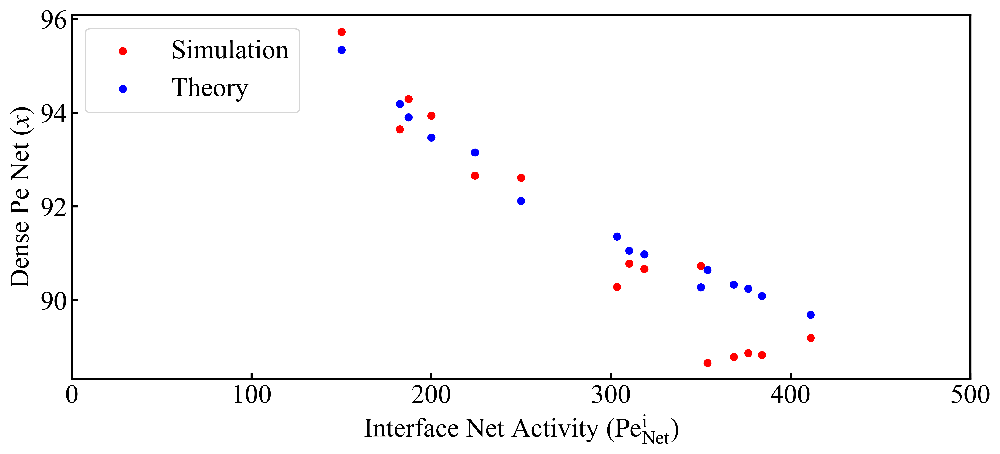

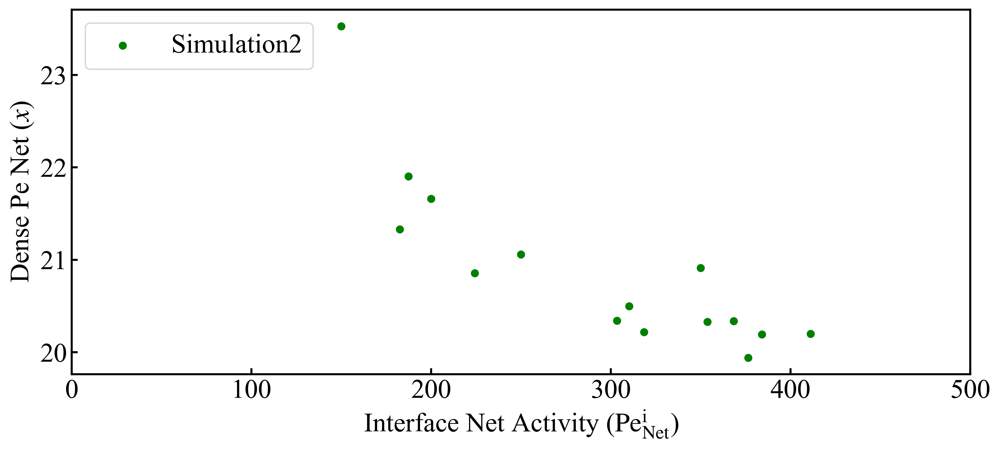

NameError: name 'stop' is not defined

In [44]:
fig, ax1 = plt.subplots(figsize=(12,5))
plt.scatter(int_pe_net, avg_rad, color='red', s=25.0, label='Simulation')
plt.scatter(int_pe_net, rad_theory, color='blue', s=25.0, label='Theory')

ax1.set_xlim([0.0,500.0])
plt.ylabel(r'Dense Pe Net ($x$)')
plt.xlabel(r'Interface Net Activity ($\mathrm{Pe}_\mathrm{Net}^\mathrm{i}$)')
plt.legend(loc = 'upper left')

plt.show()

fig, ax1 = plt.subplots(figsize=(12,5))
plt.scatter(int_pe_net, avg_width, color='green', s=25.0, label='Simulation2')

ax1.set_xlim([0.0,500.0])
plt.ylabel(r'Dense Pe Net ($x$)')
plt.xlabel(r'Interface Net Activity ($\mathrm{Pe}_\mathrm{Net}^\mathrm{i}$)')
plt.legend(loc = 'upper left')

plt.show()
stop
fig, ax1 = plt.subplots(figsize=(12,5))
plt.scatter(int_pe_net, press_int2, color='blue', s=25.0, label='Theory')
plt.scatter(int_pe_net, press_interpart, color='green', s=25.0, label='Simulation2')

ax1.set_xlim([0.0,500.0])
plt.ylabel(r'Dense Pe Net ($x$)')
plt.xlabel(r'Interface Net Activity ($\mathrm{Pe}_\mathrm{Net}^\mathrm{i}$)')
plt.legend(loc = 'upper left')

plt.show()

fig, ax1 = plt.subplots(figsize=(12,5))
plt.scatter(int_pe_net, dense_pe_net, color='blue', s=25.0, label='Theory')
#plt.scatter(int_pe_net, align_press_arr, color='green', s=25.0, label='Simulation2')

ax1.set_xlim([0.0,500.0])
plt.ylabel(r'Dense Pe Net ($x$)')
plt.xlabel(r'Interface Net Activity ($\mathrm{Pe}_\mathrm{Net}^\mathrm{i}$)')
plt.legend(loc = 'upper left')

plt.show()

fig, ax1 = plt.subplots(figsize=(12,5))
#plt.scatter(int_pe_net, lat_theory_mean_dense, color='blue', s=25.0, label='Theory')
plt.scatter(int_pe_net, lat_theory_mean_int, color='green', s=25.0, label='Theory')

#plt.scatter(int_pe_net, lat_theory_mean_bulk, color='purple', s=25.0, label='Theory')

plt.scatter(int_pe_net, all_lat_mean, color='red', s=25.0, label='Simulation')
#plt.scatter(int_pe_net, align_press_arr, color='green', s=25.0, label='Simulation2')

ax1.set_xlim([0.0,500.0])
plt.ylabel(r'Lattice Spacing ($a$)')
plt.xlabel(r'Interface Net Activity ($\mathrm{Pe}_\mathrm{Net}^\mathrm{i}$)')
plt.legend(loc = 'upper left')

plt.show()

fig, ax1 = plt.subplots(figsize=(12,5))
plt.scatter(int_pe_net, press_theory, color='blue', s=25.0, label='Theory')
plt.scatter(int_pe_net, interpart_press, color='red', s=25.0, label='Simulation')
#plt.scatter(int_pe_net, align_press_arr, color='green', s=25.0, label='Simulation2')

ax1.set_xlim([0.0,500.0])
plt.ylabel(r'$\Pi_\mathrm{d}$')
plt.xlabel(r'Interface Net Activity ($\mathrm{Pe}_\mathrm{Net}^\mathrm{i}$)')
plt.legend(loc = 'upper left')

plt.show()

fig, ax1 = plt.subplots(figsize=(12,5))
plt.scatter(int_pe_net, ((interpart_press-press_theory)/press_theory)*100, color='blue', s=25.0)
ax1.set_xlim([0.0,500.0])
ax1.set_ylim([-100, 100])
plt.ylabel(r'Percent Error $\Pi_\mathrm{d}$')
plt.xlabel(r'Interface Net Activity ($\mathrm{Pe}_\mathrm{Net}^\mathrm{i}$)')
plt.show()

#Define colors for plots    
yellow = ("#fdfd96")
green = ("#77dd77")
red = ("#ff6961")
purple = ("#cab2d6")
std = 0
for k in range(0, len(beta_final_arr)):
    std += (beta_final_arr[k]-np.mean(beta_final_arr))**2
std_beta = (std/len(beta_final_arr))**0.5
fig, ax1 = plt.subplots(figsize=(12,5))
y_arr = np.ones(2) * np.mean(beta_final_arr)
x_arr = np.array([0, 500])
y_arr_min = y_arr - std_beta
y_arr_max = y_arr + std_beta
ax1.plot(x_arr, y_arr, linewidth = 1.8*1.8, color='black')
ax1.plot(x_arr, y_arr_min, linewidth = 1.5, color='black', linestyle='--')
ax1.plot(x_arr, y_arr_max, linewidth = 1.5, color='black', linestyle='--')

ax1.fill_between(x_arr, y_arr_min, y_arr_max, color='black', alpha=0.2)
ax1.scatter(int_pe_net, beta_final_arr, color='red', s=30.0)

plt.text(0.85, 0.9, s=r'$\mu_\beta$' + ' = ' + '{:.3f}'.format(np.mean(beta_final_arr)),
                fontsize=18, transform = ax1.transAxes,
                bbox=dict(facecolor=(1,1,1,0.75), edgecolor=(0,0,0,1), boxstyle='round, pad=0.1'))
ax1.set_xlim([0, 500])
ax1.set_ylim([0.0,2.2])
ax1.set_ylabel(r'$\beta$')
ax1.set_xlabel(r'Interface Net Activity ($\mathrm{Pe}_\mathrm{Net}^\mathrm{i}$)')

plt.show()



fig, ax1 = plt.subplots(figsize=(12,5))
#plt.scatter(phase_peNet, beta_test_arr, color=purple, s=25.0, label='total')
#plt.scatter((((avg_dense_nA/avg_dense_n) * phase_peA + (avg_dense_nB/avg_dense_n) * phase_peB)), beta_test_arr, color=red, s=25.0, label='dense')
#plt.scatter((((avg_int_nA/avg_int_n) * phase_peA + (avg_int_nB/avg_int_n) * phase_peB)), beta_test_arr, color=yellow, s=25.0, label='int')
#plt.scatter(phase_peA, beta_test_arr, color=red, s=25.0, label='Slow')
plt.scatter(phase_peB, beta_test_arr, color=green, s=25.0, label='Fast Activity')
plt.ylabel(r'$\beta F^a$')
plt.xlabel(r'Fast Activity ($\mathrm{Pe}_\mathrm{F}$)')
#plt.scatter((((avg_bulk_nA/avg_bulk_n) * phase_peA + (avg_bulk_nB/avg_bulk_n) * phase_peB)), beta_test_arr, color=green, s=25.0, label='bulk')
plt.legend(loc='upper left')
#ax1.set_ylim([0.0,1.0])
plt.show()
stop
    
    
    
fig, ax1 = plt.subplots(figsize=(12,5))
plt.scatter(dense_pe_net, bulk_lat_mean, color='blue', s=25.0)
#plt.scatter(phase_peNet, lat_theory_mean, color='red', s=25.0)
ax1.set_ylim([0.0,1.0])
plt.show()

fig, ax1 = plt.subplots(figsize=(12,5))
plt.scatter(phase_peA, beta_theory, color='blue', s=25.0)
plt.ylabel(r'$\beta$')
plt.xlabel(r'Fast Activity ($\mathrm{Pe}_\mathrm{F}$)')
plt.ylim([0,4.0])

plt.show()
'''
fig, ax1 = plt.subplots(figsize=(12,5))

plt.scatter(phase_peNet, beta_theory2, color='green', s=25.0)
plt.ylim([0,4.0])

plt.show()
fig, ax1 = plt.subplots(figsize=(12,5))

plt.scatter(phase_peNet, beta_theory3, color='red', s=25.0)
plt.ylim([0,4.0])
plt.show()

fig, ax1 = plt.subplots(figsize=(12,5))

plt.scatter(phase_peNet, beta_theory4, color='red', s=25.0)
plt.ylim([0,4.0])

plt.show()
#plt.scatter(phase_peNet, lat_theory_mean, color='red', s=25.0)
#ax1.set_ylim([0.0,1.0])
'''

2.4117511378333045
0
200


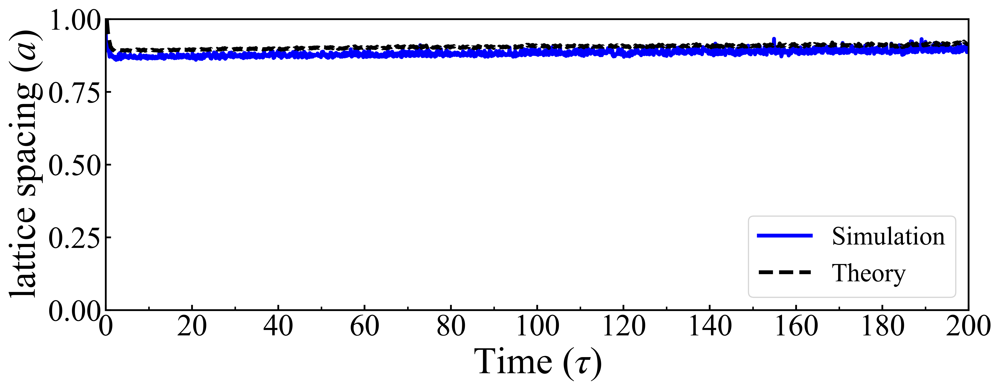

2.512161202455867
0
250


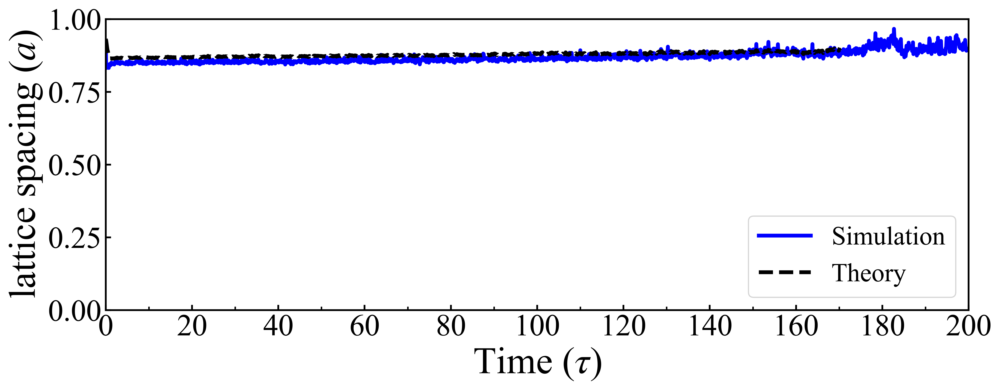

2.897493691663362
0
450


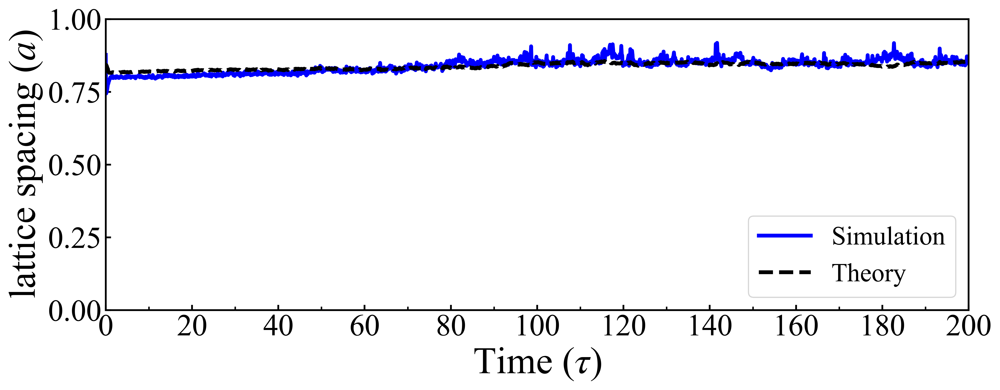

2.350510755683512
50
200


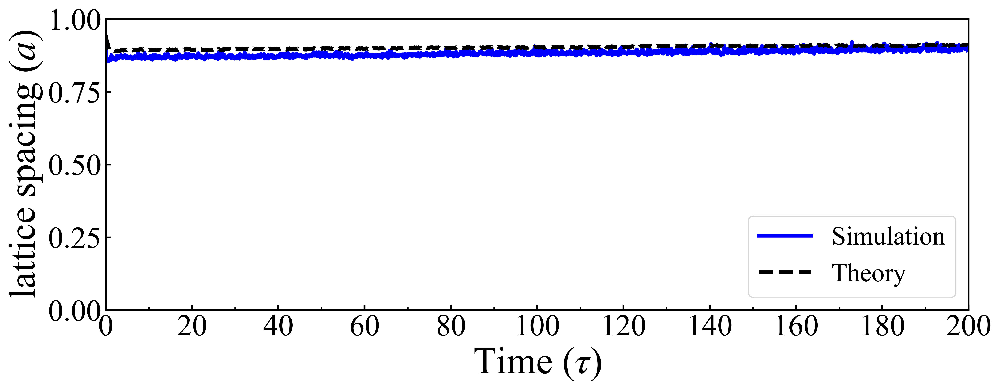

2.87911121869695
50
450


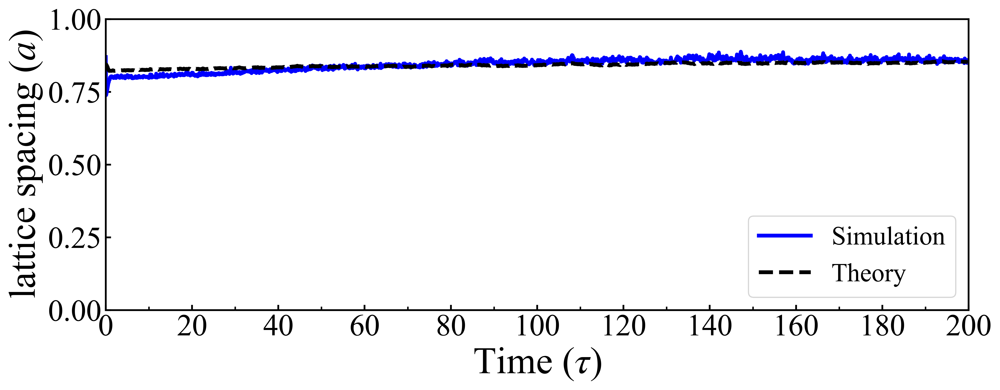

2.5004397808758023
50
250


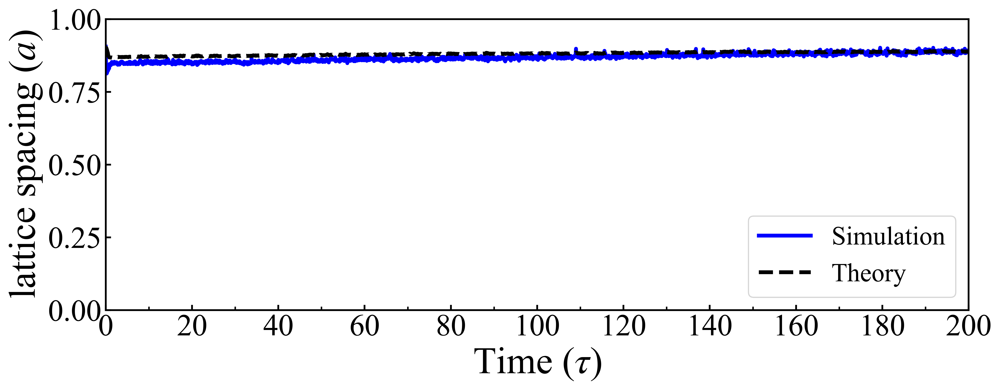

2.7182000397502937
50
350


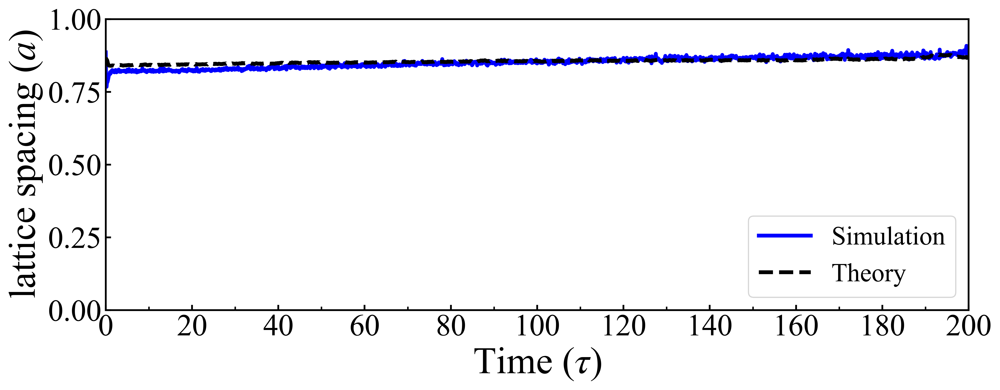

2.720444641824121
100
450


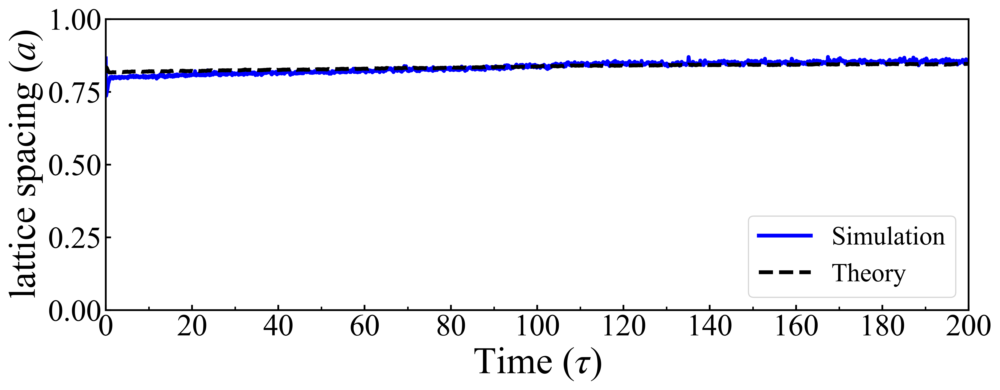

2.2843752843436897
100
200


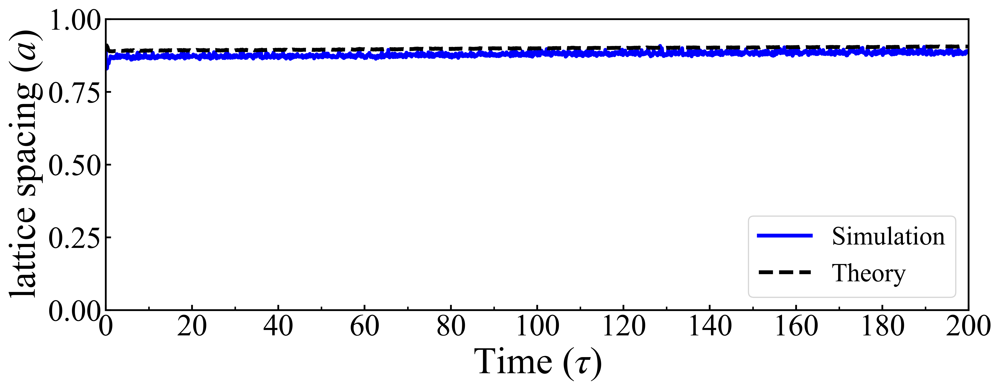

2.438723722995138
100
250


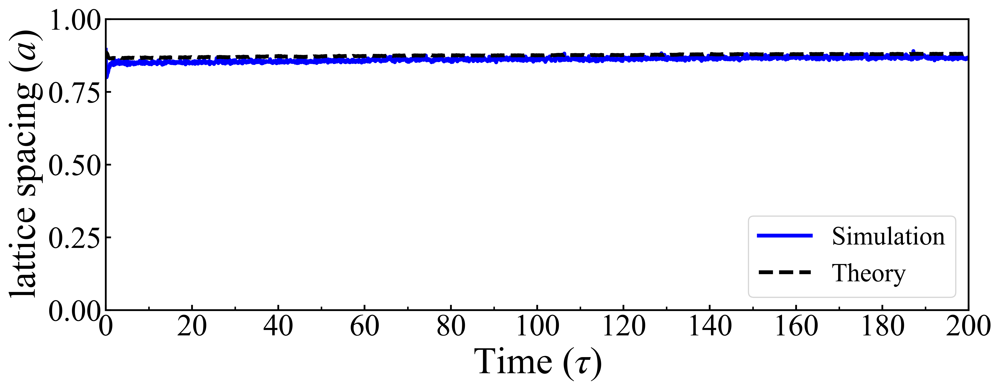

2.0508068042633627
150
150


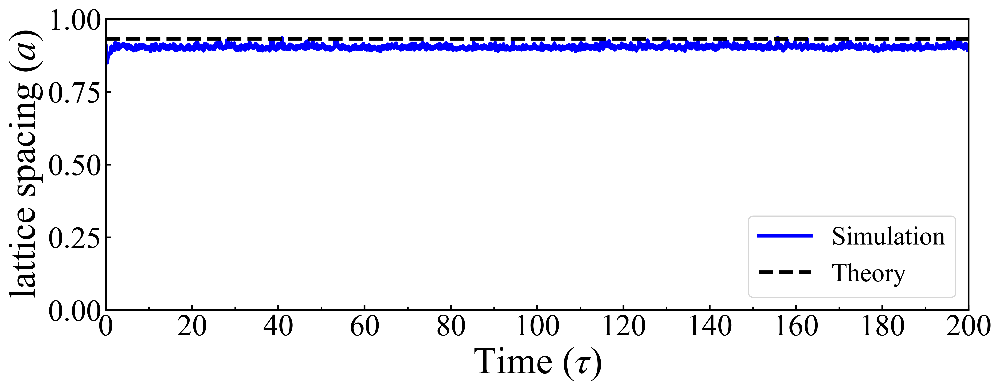

2.5980698250175505
150
350


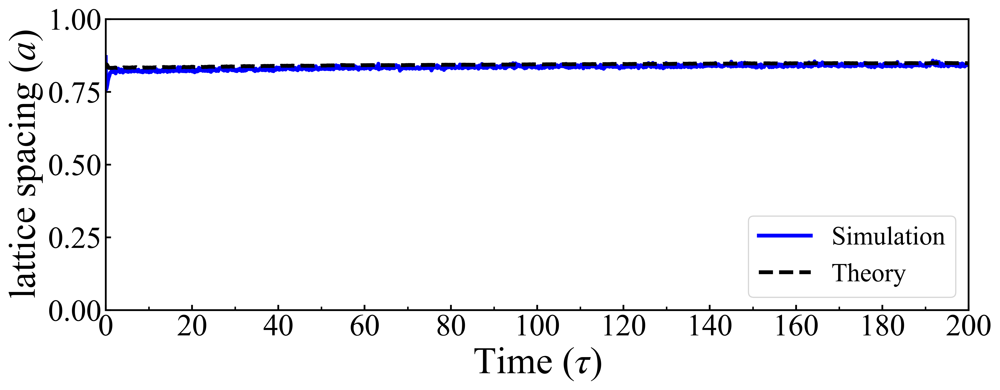

2.708754748139766
150
450


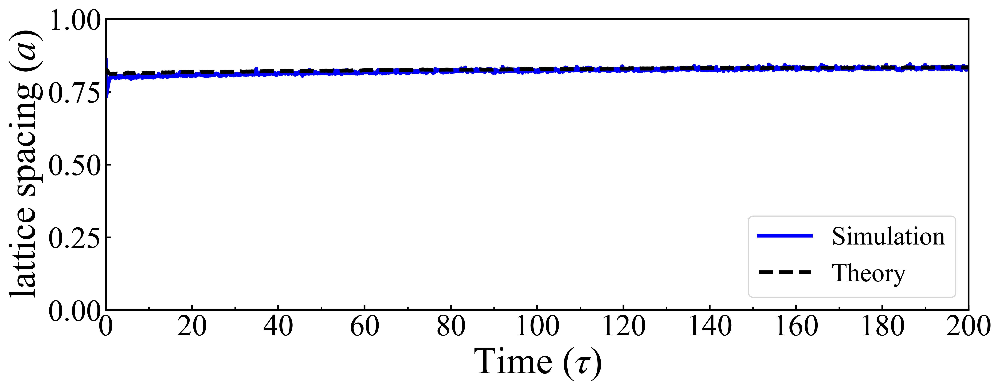

2.240026221533947
150
200


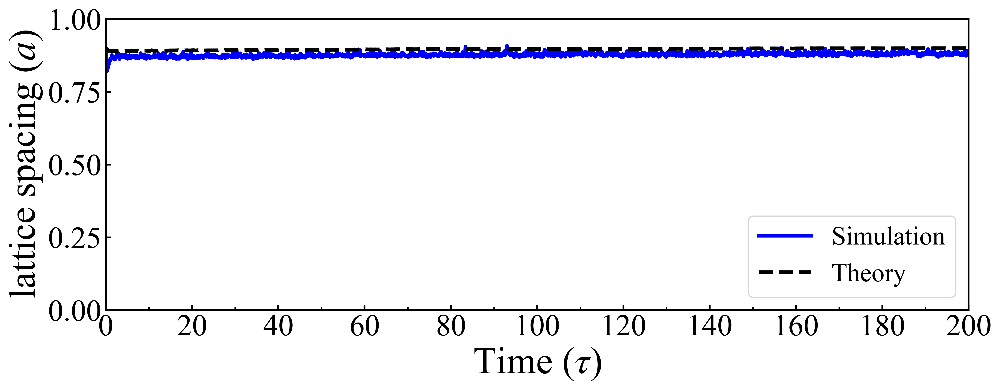

2.3569592826684547
200
200


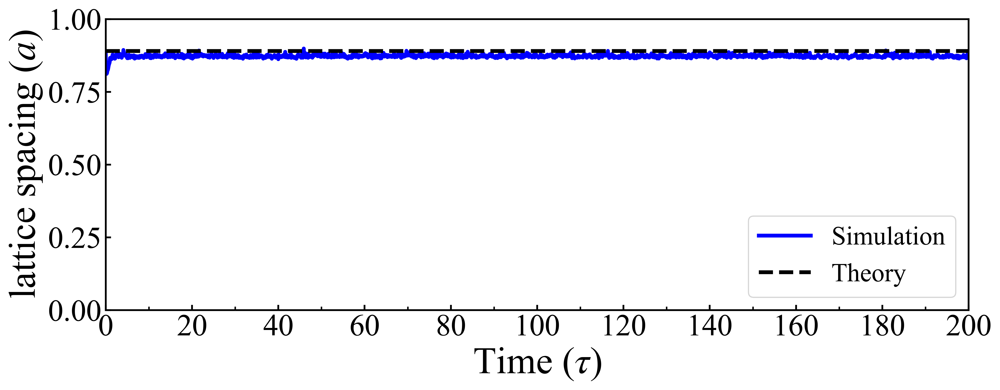

2.691091091621439
200
450


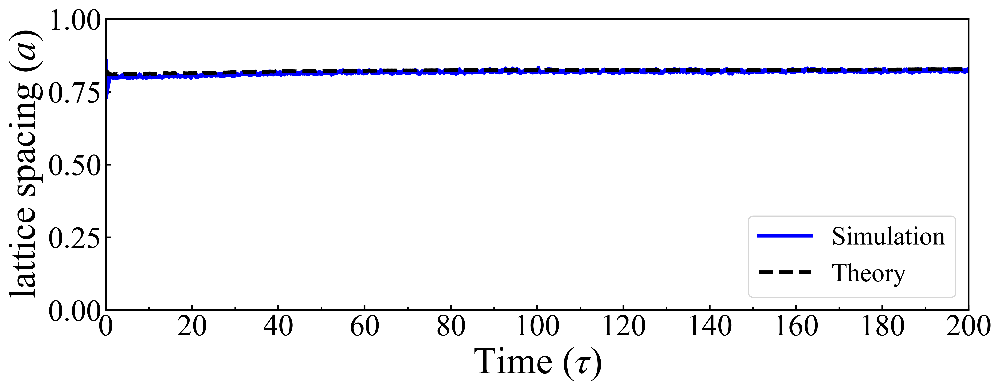

2.599692291122635
200
350


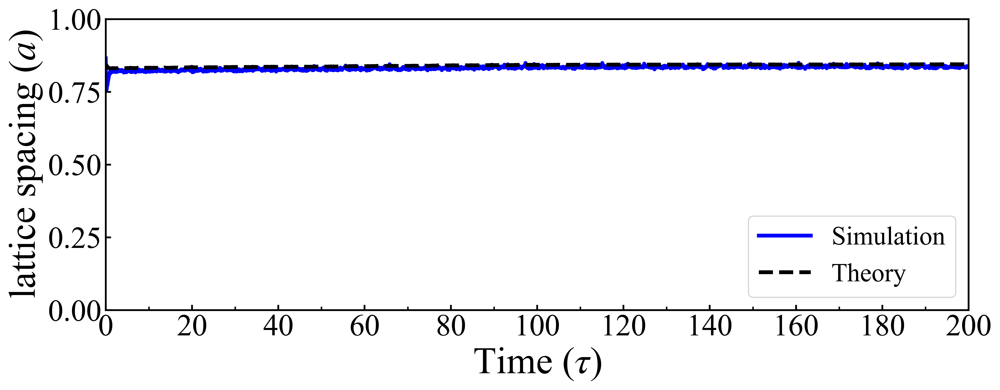

2.6430081852041125
250
350


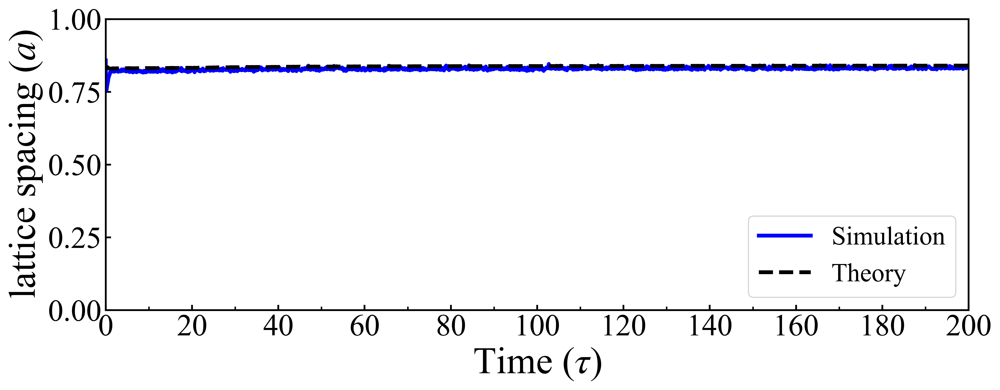

2.576758117114002
250
250


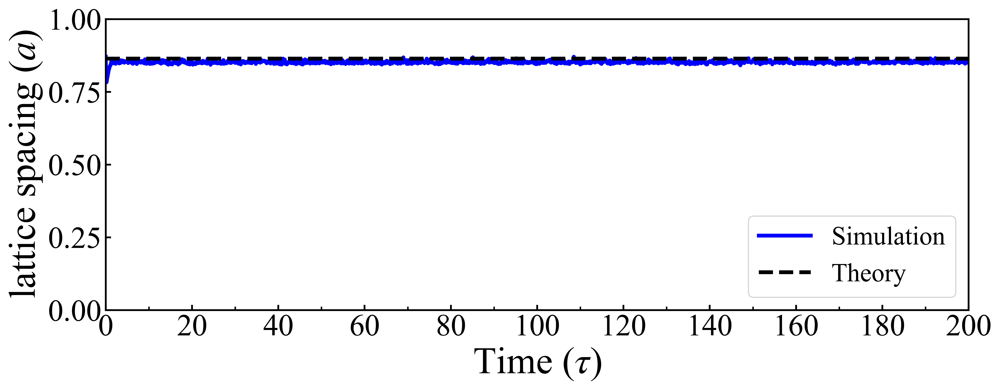

2.7017951908353313
250
450


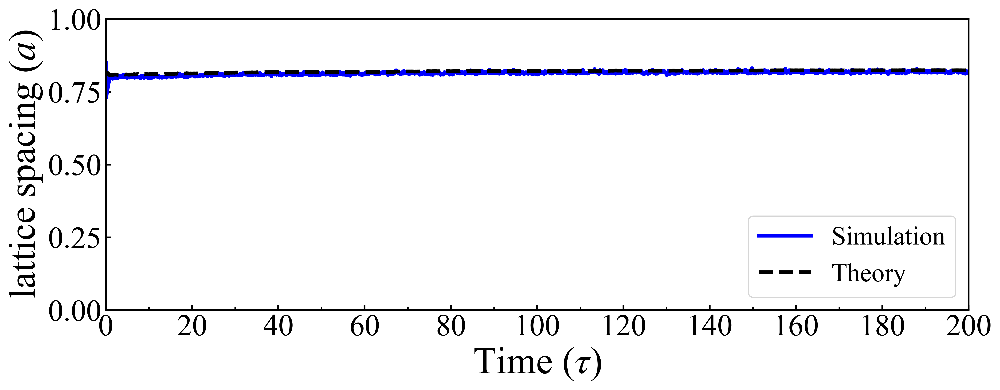

2.9415436647808617
350
350


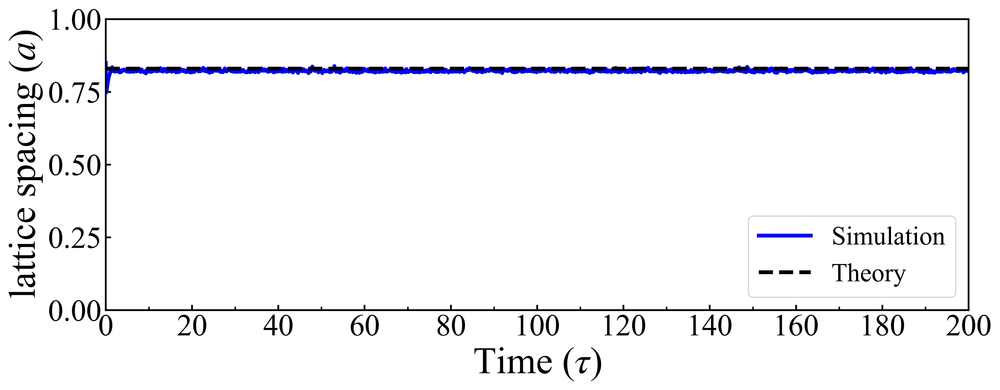

2.8735502192380475
350
450


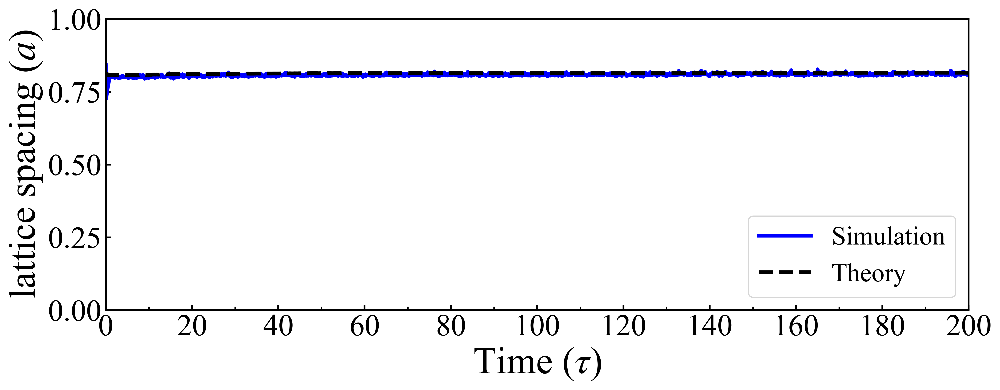

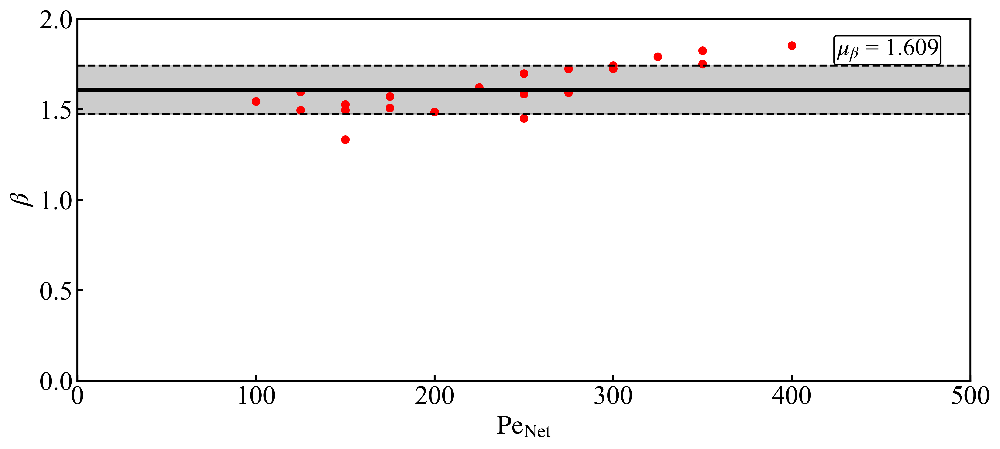

NameError: name 'stop' is not defined

In [115]:
interpart_peA=np.array([])
interpart_peB=np.array([])
interpart_peNet=np.array([])
interpart_xA=np.array([])
interpart_eps=np.array([])
interpart_pnum=np.array([])
interpart_phi=np.array([])
interpart_press=np.array([])
interpart_press_expand=np.array([])


        
        
phase_peA=np.array([])
phase_peB=np.array([])
phase_peRat=np.array([])
phase_peDif=np.array([])
phase_peNet=np.array([])
phase_xA=np.array([])
phase_eps=np.array([])
phase_pnum=np.array([])
phase_phi=np.array([])
avg_bulk_nA = np.array([])
avg_bulk_nB = np.array([])
avg_int_nA = np.array([])
avg_int_nB = np.array([])
avg_gas_nA = np.array([])
avg_gas_nB = np.array([])
beta_arr = np.array([])
beta_peNet = np.array([])
avg_shear=np.array([])
bulk_lat_mean = np.array([])
beta_arr2 = np.array([])
int_lat_mean = np.array([])
all_lat_mean = np.array([])
beta_arr2_std = np.array([])

avg_bulk_nA = np.array([])
avg_bulk_nB = np.array([])
avg_bulk_n = np.array([])
avg_dense_nA = np.array([])
avg_dense_nB = np.array([])
avg_dense_n = np.array([])
avg_int_n = np.array([])

avg_int_nA = np.array([])
avg_int_nB = np.array([])
avg_gas_nA = np.array([])
avg_gas_nB = np.array([])
beta_final_arr=np.array([])
time_arr3 = np.array([])

def densProbability(r, activity_net, activity_slow):
    "Using similar triangles to find sides"
    gas_dense_dif_phi = 0.866 * np.log10(activity_net - 46.993) - 0.443
    rate_decay = -6.151 * np.log10(activity_net-49.921) - 4.392
    mid_point = 0.044 * np.log10(activity_slow-49.893) + 0.836
    gas_phi = -0.26 * np.log10(activity_slow-41.742)+0.783
    
    num_dens_r = ((gas_dense_dif_phi / (1+np.exp(-rate_decay * (r-mid_point)))) + gas_phi)
    
    return num_dens_r

def alignProbability(r, activity_net, activity_slow):
    "Using similar triangles to find sides"
    max_align = 0.2019 * np.log10(activity_net - 41.2803) - 0.1885
    mid_point = 0.0492 * np.log10(activity_slow - 47.0061) + 0.8220
    std_dev = 0.1057
    align_r = max_align * np.exp(-(r-mid_point)**2/(2*std_dev**2))
    
    return align_r

beta_test_arr = np.array([])
for n in range(0, len(all_pres_new)):
    if params3['peA'][n]!=450:
        time_arr3 = np.array([])
        bulk_nA_arr = np.array([])
        bulk_nB_arr = np.array([])
        bulk_n_arr = np.array([])
        int_n_arr = np.array([])
        int_nA_arr = np.array([])
        int_nB_arr = np.array([])
        gas_nA_arr = np.array([])
        gas_nB_arr = np.array([])
        dense_nA_arr = np.array([])
        dense_nB_arr = np.array([])
        dense_n_arr = np.array([])

        for j in range(0, len(all_pres_new[n]['clust_size'])):
            #if all_dens[i]['clust_size'][j]>=0.95*max_size:
                bin_size = all_pres_new[n]['sizeBin'][j]
                bin_area = bin_size**2
                time_arr3 = np.append(time_arr3, all_pres_new[n]['tauB'][j])
                bulk_nA_arr = np.append(bulk_nA_arr, all_pres_new[n]['Na_bulk'][j] / (bin_area * all_pres_new[n]['NBin_bulk'][j]))
                bulk_nB_arr = np.append(bulk_nB_arr, all_pres_new[n]['Nb_bulk'][j] / (bin_area * all_pres_new[n]['NBin_bulk'][j]))
                bulk_n_arr = np.append(bulk_n_arr, (all_pres_new[n]['Nb_bulk'][j]+all_pres_new[n]['Na_bulk'][j]) / (bin_area * all_pres_new[n]['NBin_bulk'][j]))
                int_n_arr = np.append(int_n_arr, (all_pres_new[n]['Na_int'][j]+all_pres_new[n]['Nb_int'][j]) / (bin_area * all_pres_new[n]['NBin_int'][j]))
                int_nA_arr = np.append(int_nA_arr, all_pres_new[n]['Na_int'][j] / (bin_area * all_pres_new[n]['NBin_int'][j]))
                int_nB_arr = np.append(int_nB_arr, all_pres_new[n]['Nb_int'][j] / (bin_area * all_pres_new[n]['NBin_int'][j]))
                gas_nA_arr = np.append(gas_nA_arr, all_pres_new[n]['Na_gas'][j] / (bin_area * all_pres_new[n]['NBin_gas'][j]))
                gas_nB_arr = np.append(gas_nB_arr, all_pres_new[n]['Nb_gas'][j] / (bin_area * all_pres_new[n]['NBin_gas'][j]))
                dense_n_arr = np.append(dense_n_arr, (all_pres_new[n]['Na_int'][j]+all_pres_new[n]['Nb_int'][j]+all_pres_new[n]['Na_bulk'][j]+all_pres_new[n]['Nb_bulk'][j]) / (bin_area * (all_pres_new[n]['NBin_int'][j]+all_pres_new[n]['NBin_bulk'][j])))
                dense_nA_arr = np.append(dense_nA_arr, (all_pres_new[n]['Na_int'][j]+all_pres_new[n]['Na_bulk'][j]) / (bin_area * (all_pres_new[n]['NBin_int'][j]+all_pres_new[n]['NBin_bulk'][j])))
                dense_nB_arr = np.append(dense_nB_arr, (all_pres_new[n]['Nb_int'][j]+all_pres_new[n]['Nb_bulk'][j]) / (bin_area * (all_pres_new[n]['NBin_int'][j]+all_pres_new[n]['NBin_bulk'][j])))

        for i in range(0, len(all_pres)):
            if params3['peA'][n]==params2['peA'][i]:
                if params3['peB'][n]==params2['peB'][i]:
                    bulk_press_total = 0
                    bulk_press_total_expand = 0
                    bulk_press_vals=0
                    time_arr = np.array([])
                    press_arr = np.array([])
                    shear_press_expand=0
                    # Don't plot non-phase-separated data
                    if all_pres[i].empty:
                            continue


                    max_size = np.amax(all_pres[i]['NDense'])
                    for j in range(0, len(all_pres[i]['NDense'])):
                        #if all_pres[i]['NDense'][j]>=0.95*max_size:

                            time_arr = np.append(time_arr, all_pres[i]['Timestep'][j])
                            bulk_trace = (all_pres[i]['bulkSigXX'].iloc[j]+all_pres[i]['bulkSigYY'].iloc[j])/2#+all_pres_new[i]['bulkSigYX'].iloc[-1]+all_pres_new[i]['bulkSigYY'].iloc[-1])/2
                            bulk_press = bulk_trace / (all_pres[i]['bulkArea'].iloc[j])

                            bulk_trace_expand = (all_pres[i]['bulkSigXX'].iloc[j]+all_pres[i]['bulkSigXY'].iloc[j]+all_pres[i]['bulkSigYX'].iloc[j]+all_pres[i]['bulkSigYY'].iloc[j])/2
                            bulk_press_expand = bulk_trace_expand / (all_pres[i]['bulkArea'].iloc[j])

                            shear_stress = (all_pres[i]['bulkSigXY'].iloc[j]+all_pres[i]['bulkSigYX'].iloc[j])/2
                            shear_press = shear_stress / (all_pres[i]['bulkArea'].iloc[j])
                            press_arr = np.append(press_arr, bulk_press/2)

                            if bulk_press > 0:
                                shear_press_expand +=shear_press
                                bulk_press_total += bulk_press
                                bulk_press_total_expand += bulk_press_expand
                                bulk_press_vals += 1
                    if bulk_press_vals > 0:        
                        avg_shear = np.append(avg_shear, shear_press_expand/bulk_press_vals)
                        avg_press = (bulk_press_total/(2*bulk_press_vals))
                        avg_press_expand = (bulk_press_total_expand/bulk_press_vals)
                        interpart_press=np.append(interpart_press, avg_press)
                        interpart_press_expand=np.append(interpart_press_expand, avg_press_expand)
                        interpart_peA=np.append(interpart_peA, params2['peA'][i])
                        interpart_peB=np.append(interpart_peB, params2['peB'][i])
                        interpart_peNet=np.append(interpart_peNet, params2['peB'][i] * (1-params2['xA'][i]/100) + params2['peA'][i] * (params2['xA'][i]/100))
                        interpart_xA=np.append(interpart_xA, params2['xA'][i])
                        interpart_phi=np.append(interpart_phi, params2['phi'][i])
                        interpart_eps=np.append(interpart_eps, params2['eps'][i])

                    for k in range(0, len(all_pres_new2)):

                        # Don't plot non-phase-separated data
                        if all_pres_new2[k].empty:
                                continue

                        if params4['peA'][k]==params2['peA'][i]:
                            if params4['peB'][k]==params2['peB'][i]:
                                if params4['peA'][k]!=450:
                                    time_arr2 = np.array([])
                                    

                                    max_size = np.amax(all_pres_new2[k]['clust_size'])
                                    bulk_lat_arr = np.array([])
                                    int_lat_arr = np.array([])
                                    all_lat_arr = np.array([])

                                    for j in range(0, len(all_pres_new2[k]['clust_size'])):
                                        #if all_dens[i]['clust_size'][j]>=0.95*max_size:
                                            bin_size = all_pres_new2[k]['sizeBin'][j]
                                            bin_area = bin_size**2
                                            time_arr2 = np.append(time_arr2, all_pres_new2[k]['tauB'][j])
                                            bulk_lat_arr = np.append(bulk_lat_arr, all_pres_new2[k]['lat_mean_bulk'][j])
                                            all_lat_arr = np.append(all_lat_arr, all_pres_new2[k]['lat_mean_all'][j])
                                            int_lat_arr = np.append(int_lat_arr, all_pres_new2[k]['lat_mean_int'][j])
                                    time_ids = np.intersect1d(time_arr, time_arr2, return_indices=True)
                                    time_ids_press = time_ids[0].astype(int)
                                    time_ids_lat = time_ids[1].astype(int)
                                    

                                    
                                    time_ids = np.intersect1d(time_ids_press, time_arr3, return_indices=True)
                                    time_ids_pres2 = time_ids[0].astype(int)
                                    time_ids_dens = time_ids[1].astype(int)
                                    #beta_plot = press_arr[time_ids_press][time_ids_pres2]/(2*np.sqrt(3)*(((dense_nA_arr[time_ids_dens]/dense_n_arr[time_ids_dens]) * phase_peA[-1] + (dense_nB_arr[time_ids_dens]/dense_n_arr[time_ids_dens]) * phase_peB[-1])-50)/bulk_lat_arr[time_ids_lat][time_ids_pres2])
                                    if np.max(time_ids_lat[time_ids_pres2])>150:
                                        
                                        avg_bulk_nA = np.append(avg_bulk_nA, np.mean(bulk_nA_arr))
                                        avg_bulk_n = np.append(avg_bulk_n, np.mean(bulk_n_arr))
                                        avg_bulk_nB = np.append(avg_bulk_nB, np.mean(bulk_nB_arr))
                                        avg_int_n = np.append(avg_int_n, np.mean(int_n_arr))

                                        avg_int_nA = np.append(avg_int_nA, np.mean(int_nA_arr))
                                        avg_int_nB = np.append(avg_int_nB, np.mean(int_nB_arr))
                                        avg_gas_nA = np.append(avg_gas_nA, np.mean(gas_nA_arr))
                                        avg_gas_nB = np.append(avg_gas_nB, np.mean(gas_nB_arr))
                                        avg_dense_nA = np.append(avg_dense_nA, np.mean(dense_nA_arr))
                                        avg_dense_n = np.append(avg_dense_n, np.mean(dense_n_arr))
                                        avg_dense_nB = np.append(avg_dense_nB, np.mean(dense_nB_arr))

        
                                        bulk_lat_mean = np.append(bulk_lat_mean, np.mean(bulk_lat_arr))
                                        all_lat_mean = np.append(all_lat_mean, np.mean(all_lat_arr))
                                        int_lat_mean = np.append(int_lat_mean, np.mean(int_lat_arr))
                                    
                                        phase_peA=np.append(phase_peA, params4['peA'][k])
                                        phase_peB=np.append(phase_peB, params4['peB'][k])
                                        phase_peDif=np.append(phase_peDif, params4['peB'][k]-params4['peA'][k])
                                        phase_peRat=np.append(phase_peRat, params4['peA'][k]/params4['peB'][k])

                                        phase_peNet=np.append(phase_peNet, params4['peB'][k] * (1-params4['xA'][k]/100) + params4['peA'][k] * (params4['xA'][k]/100))
                                        phase_xA=np.append(phase_xA, params4['xA'][k])
                                        phase_phi=np.append(phase_phi, params4['phi'][k])
                                        phase_eps=np.append(phase_eps, params4['eps'][k])

                                        beta_plot = press_arr[time_ids_press][time_ids_pres2]

                                        beta_test_arr = np.append(beta_test_arr, beta_plot[-1]) 
                                        #plt.plot(time_arr, press_arr/np.max(press_arr), '-', color='green', label='Press',lw=1.8*1.8)
                                        

                                        beta2 = ((24/phase_peB[-1]) * (2*(1.0/bulk_lat_arr)**13 - (1.0/bulk_lat_arr)**7))
                                        print(np.mean(beta2))
                                        ymin = np.mean(beta2)-1
                                        ymax=np.mean(beta2)+1
                                        
                                        xy, x_ind, y_ind = np.intersect1d(time_arr2, time_arr3, return_indices=True)
                                        #x_test = (((dense_nA_arr[y_ind]/dense_n_arr[y_ind]) * phase_peA[-1] + (dense_nB_arr[y_ind]/dense_n_arr[y_ind]) * phase_peB[-1])-50)/bulk_lat_arr[x_ind]
                                        div=(1/all_lat_arr[x_ind])
                                        x_test = (24.) * ((2*(div**13)) - (div)**7)
                                        y_test = (int_nA_arr[y_ind]/int_n_arr[y_ind]) * phase_peA[-1] + (int_nB_arr[y_ind]/int_n_arr[y_ind]) * phase_peB[-1]
                                        #y_test = np.ones(len(int_nA_arr[y_ind]))
                                        from scipy.optimize import curve_fit
                                        def func(x, m):
                                            return x/m

                                        xy2, x_ind2, y_ind2 = np.intersect1d(time_arr2[x_ind], time_arr, return_indices=True)

                                        popt, pcov = curve_fit(func, x_test, y_test-50)
                                        beta_final_arr = np.append(beta_final_arr, popt[0])
                                        
                                        def ljForce(r, eps, sigma=1.):
                                            div = (sigma/r)
                                            dU = (24. * eps / sigma) * ((2*(div**13)) - (div)**7)
                                            return dU

                                        def avgCollisionForce(pe, coeff2, power=1.):
                                            '''Computed from the integral of possible angles'''
                                            peCritical = 40.
                                            if pe < peCritical:
                                                pe = 0
                                            else:
                                                pe -= peCritical
                                            magnitude = 6.
                                            # A vector sum of the six nearest neighbors
                                            magnitude = np.sqrt(28)
                                        #     return (magnitude * (pe**power)) / (np.pi)
                                        #     return (pe * (1. + (8./(np.pi**2.))))
                                            coeff = coeff2#1.764#3.0#1.92#2.03#3.5#2.03
                                            #coeff= 0.4053
                                            return (pe * coeff)

                                        def conForRClust(pe, eps, coeff2):
                                            out = []
                                            r = 1.112
                                            skip = [0.1, 0.01, 0.001, 0.0001, 0.00001, 0.000001, 0.0000001, 0.00000001]
                                            for j in skip:
                                                while ljForce(r, eps) < avgCollisionForce(pe, coeff2):
                                                    r -= j
                                                r += j
                                            out = r
                                            return out

                                        fig, ax1 = plt.subplots(figsize=(12,5))

                                        x_arr = np.array([0, 200])
                                        y_arr = np.ones(2)
                                        lat_theory = np.zeros(len(time_arr3))
                                        for p in range(0, len(time_arr3)):
                                            lat_theory[p] = conForRClust(y_test[p]-50, 1.0, beta_final_arr[-1])
                                            #lat_theory[p] = getLat(phase_peB[-1], 1.0)
                                        #y_arr_now = np.ones(2) * lat_theory
                                        print(params2['peA'][i])
                                        print(params2['peB'][i])
                                        
                                        plt.plot(time_arr2, all_lat_arr, '-', linewidth=1.8*1.8, color='blue', label='Simulation')
                                        plt.plot(time_arr3, lat_theory, '--', linewidth=1.8*1.8, color='black', label='Theory')
                                        #plt.plot(x_arr, y_arr, '--', color='black', lw=1.8*1.8)
                                        #plt.plot(x_arr, y_arr2, '--', color='green', lw=1.8*1.8)
                                        # Set all the x ticks for radial plots
                                        loc = ticker.MultipleLocator(base=20)
                                        ax1.xaxis.set_major_locator(loc)
                                        loc = ticker.MultipleLocator(base=10)
                                        ax1.xaxis.set_minor_locator(loc)
                                       # Set y ticks
                                        #loc = ticker.MultipleLocator(base=0.2)
                                        #ax1.yaxis.set_major_locator(loc)
                                        #loc = ticker.MultipleLocator(base=0.1)
                                        #ax1.yaxis.set_minor_locator(loc)


                                        ax1.tick_params(axis='x', labelsize=26)
                                        ax1.tick_params(axis='y', labelsize=26)
                                        ax1.set_xlabel(r'Time ($\tau$)', fontsize=32)
                                        ax1.set_ylabel(r'lattice spacing ($a$)', fontsize=32)
                                        #ax1.set_ylim([-0.05,1.05])
                                        props = dict(boxstyle='square', facecolor='white', edgecolor='none', alpha=0.85, pad=0.1)
                                        #ax1.text(0.44, 0.88, r'$n(x)=(0.0023\mathrm{Pe}_\mathrm{Net}+1.0194)/(1+e^{18.8699(x-0.92902)})+(-0.000683\mathrm{Pe}_\mathrm{Net}+0.3534)$', zorder=10,
                                        #           transform=ax1.transAxes,
                                        #           fontsize=22,fontdict={'fontname':'Helvetica'}, bbox=props)  
                                        plt.legend(loc='lower right', fontsize=22)
                                        ax1.set_ylim([0,1.0])
                                        ax1.set_xlim([0, 200])
                                        #plt.ylim([ymin,ymax])
                                        plt.tight_layout()
                                        plt.show()
                                        
                                        xy, x_ind, y_ind = np.intersect1d(time_arr2, time_arr3, return_indices=True)
                                        #x_test = (((dense_nA_arr[y_ind]/dense_n_arr[y_ind]) * phase_peA[-1] + (dense_nB_arr[y_ind]/dense_n_arr[y_ind]) * phase_peB[-1])-50)/bulk_lat_arr[x_ind]
                                        x_test = (((int_nA_arr[y_ind]/int_n_arr[y_ind]) * phase_peA[-1] + (int_nB_arr[y_ind]/int_n_arr[y_ind]) * phase_peB[-1])-50)/bulk_lat_arr[x_ind]
                                        from scipy.optimize import curve_fit
                                        def func(x, m):
                                            return   x * 2.0 * m *np.sqrt(3)

                                        xy2, x_ind2, y_ind2 = np.intersect1d(time_arr2[x_ind], time_arr, return_indices=True)

                                        popt, pcov = curve_fit(func, x_test, press_arr[y_ind2])
                                        #beta_final_arr = np.append(beta_final_arr, popt[0])
                                        

                                        beta_arr = np.append(beta_arr, interpart_press[-1]/(2*np.sqrt(3)*interpart_peNet[-1]/bulk_lat_mean[-1]))
                                        beta_arr2 = np.append(beta_arr2, np.mean(beta2))
                                        std_sum = 0
                                        std_num =0
                                        for o in range(0, len(bulk_lat_arr)):
                                            std_sum +=(bulk_lat_arr[o]-bulk_lat_mean[-1])**2
                                            std_num +=1

                                        beta_arr2_std = np.append(beta_arr2_std, (std_sum/std_num)**0.5)
                                        beta_peNet=np.append(beta_peNet, params4['peB'][k] * (1-params4['xA'][k]/100) + params4['peA'][k] * (params4['xA'][k]/100))

#Define colors for plots    
yellow = ("#fdfd96")
green = ("#77dd77")
red = ("#ff6961")
purple = ("#cab2d6")
std = 0
for k in range(0, len(beta_final_arr)):
    std += (beta_final_arr[k]-np.mean(beta_final_arr))**2
std_beta = (std/len(beta_final_arr))**0.5
fig, ax1 = plt.subplots(figsize=(12,5))
y_arr = np.ones(2) * np.mean(beta_final_arr)
x_arr = np.array([0, 500])
y_arr_min = y_arr - std_beta
y_arr_max = y_arr + std_beta
ax1.plot(x_arr, y_arr, linewidth = 1.8*1.8, color='black')
ax1.plot(x_arr, y_arr_min, linewidth = 1.5, color='black', linestyle='--')
ax1.plot(x_arr, y_arr_max, linewidth = 1.5, color='black', linestyle='--')

ax1.fill_between(x_arr, y_arr_min, y_arr_max, color='black', alpha=0.2)
ax1.scatter(phase_peNet, beta_final_arr, color='red', s=30.0)

plt.text(0.85, 0.9, s=r'$\mu_\beta$' + ' = ' + '{:.3f}'.format(np.mean(beta_final_arr)),
                fontsize=18, transform = ax1.transAxes,
                bbox=dict(facecolor=(1,1,1,0.75), edgecolor=(0,0,0,1), boxstyle='round, pad=0.1'))
ax1.set_xlim([0, 500])
ax1.set_ylim([0.0,2])
ax1.set_ylabel(r'$\beta$')
ax1.set_xlabel(r'$\mathrm{Pe}_\mathrm{Net}$')

plt.show()
stop




fig, ax1 = plt.subplots(figsize=(12,5))
#plt.scatter(phase_peNet, beta_test_arr, color=purple, s=25.0, label='total')
#plt.scatter((((avg_dense_nA/avg_dense_n) * phase_peA + (avg_dense_nB/avg_dense_n) * phase_peB)), beta_test_arr, color=red, s=25.0, label='dense')
#plt.scatter((((avg_int_nA/avg_int_n) * phase_peA + (avg_int_nB/avg_int_n) * phase_peB)), beta_test_arr, color=yellow, s=25.0, label='int')
#plt.scatter(phase_peA, beta_test_arr, color=red, s=25.0, label='Slow')
plt.scatter(phase_peB, beta_test_arr, color=green, s=25.0, label='Fast Activity')
plt.ylabel(r'$\beta F^a$')
plt.xlabel(r'Fast Activity ($\mathrm{Pe}_\mathrm{F}$)')
#plt.scatter((((avg_bulk_nA/avg_bulk_n) * phase_peA + (avg_bulk_nB/avg_bulk_n) * phase_peB)), beta_test_arr, color=green, s=25.0, label='bulk')
plt.legend(loc='upper left')
#ax1.set_ylim([0.0,1.0])
plt.show()
lat_theory_mean_int = np.zeros(len(phase_peNet))
lat_theory_mean_bulk = np.zeros(len(phase_peNet))

lat_theory_mean_dense = np.zeros(len(phase_peNet))

dense_pe_net = np.zeros(len(phase_peNet))
bulk_pe_net = np.zeros(len(phase_peNet))
int_pe_net = np.zeros(len(phase_peNet))

beta_theory = np.zeros(len(phase_peNet))
beta_theory2 = np.zeros(len(phase_peNet))

beta_theory3 = np.zeros(len(phase_peNet))
beta_theory4 = np.zeros(len(phase_peNet))

div = (1.0/bulk_lat_mean)
dU = (24.) * ((2*(div**13)) - (div)**7)
for p in range(0, len(phase_peNet)):
    dense_pe_net[p]=(((avg_dense_nA[p]/avg_dense_n[p]) * phase_peA[p] + (avg_dense_nB[p]/avg_dense_n[p]) * phase_peB[p]))
    bulk_pe_net[p]=((avg_bulk_nA[p]/avg_bulk_n[p]) * phase_peA[p] + (avg_bulk_nB[p]/avg_bulk_n[p]) * phase_peB[p])
    int_pe_net[p]=(((avg_int_nA[p]/avg_int_n[p]) * phase_peA[p] + (avg_int_nB[p]/avg_int_n[p]) * phase_peB[p]))

    beta_theory[p] = dU[p]/phase_peB[p]
    #print(beta_theory[p])
    beta_theory2[p] = dU[p]/bulk_pe_net[p]
    beta_theory3[p] = dU[p]/dense_pe_net[p]
    beta_theory4[p] = dU[p]/phase_peNet[p]
    lat_theory_mean_int[p] = conForRClust(bulk_pe_net[p], 1.0)
    lat_theory_mean_bulk[p] = conForRClust((((avg_bulk_nA[p]/avg_bulk_n[p]) * phase_peA[-1] + (avg_bulk_nB[p]/avg_bulk_n[p]) * phase_peB[-1])), 1.0)
    lat_theory_mean_dense[p] = conForRClust((((avg_dense_nA[p]/avg_dense_n[p]) * phase_peA[-1] + (avg_dense_nB[p]/avg_dense_n[p]) * phase_peB[-1])), 1.0)
fig, ax1 = plt.subplots(figsize=(12,5))
plt.scatter(dense_pe_net, bulk_lat_mean, color='blue', s=25.0)
plt.scatter(phase_peNet, lat_theory_mean_int, color='red', s=25.0)
ax1.set_xlim([0, 500])
ax1.set_ylim([0.0,1.0])
ax1.set_ylabel(r'$a$')
ax1.set_xlabel(r'$\mathrm{Pe}_\mathrm{Net}$')
plt.show()

fig, ax1 = plt.subplots(figsize=(12,5))
plt.scatter(phase_peA, beta_theory, color='blue', s=25.0)
plt.ylabel(r'$\beta$')
plt.xlabel(r'Fast Activity ($\mathrm{Pe}_\mathrm{F}$)')
plt.ylim([0,4.0])

plt.show()
'''
fig, ax1 = plt.subplots(figsize=(12,5))

plt.scatter(phase_peNet, beta_theory2, color='green', s=25.0)
plt.ylim([0,4.0])

plt.show()
fig, ax1 = plt.subplots(figsize=(12,5))

plt.scatter(phase_peNet, beta_theory3, color='red', s=25.0)
plt.ylim([0,4.0])
plt.show()

fig, ax1 = plt.subplots(figsize=(12,5))

plt.scatter(phase_peNet, beta_theory4, color='red', s=25.0)
plt.ylim([0,4.0])

plt.show()
#plt.scatter(phase_peNet, lat_theory_mean, color='red', s=25.0)
#ax1.set_ylim([0.0,1.0])
'''

2.4117511378333045
2.512161202455867
2.897493691663362
2.350510755683512
2.87911121869695
2.5004397808758023
2.7182000397502937
2.720444641824121
2.2843752843436897
2.438723722995138
2.0508068042633627
2.5980698250175505
2.708754748139766
2.240026221533947
2.3569592826684547
2.691091091621439
2.599692291122635
2.6430081852041125
2.576758117114002
2.7017951908353313
2.9415436647808617
2.8735502192380475


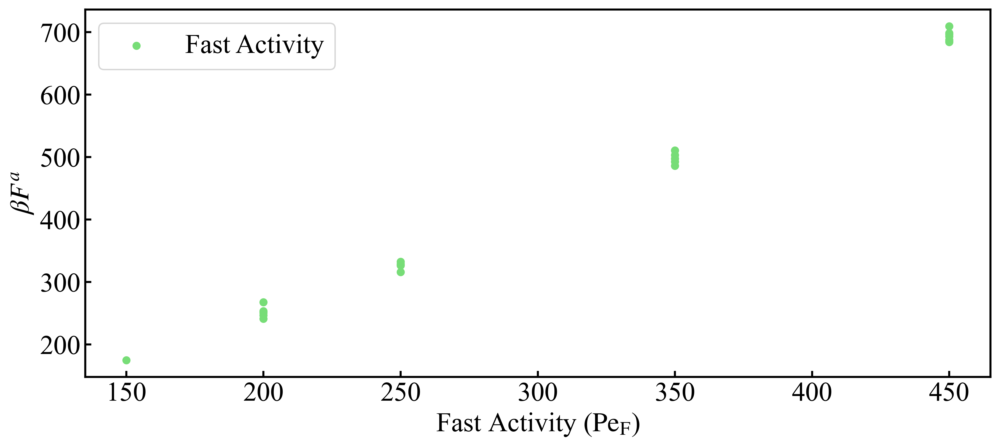

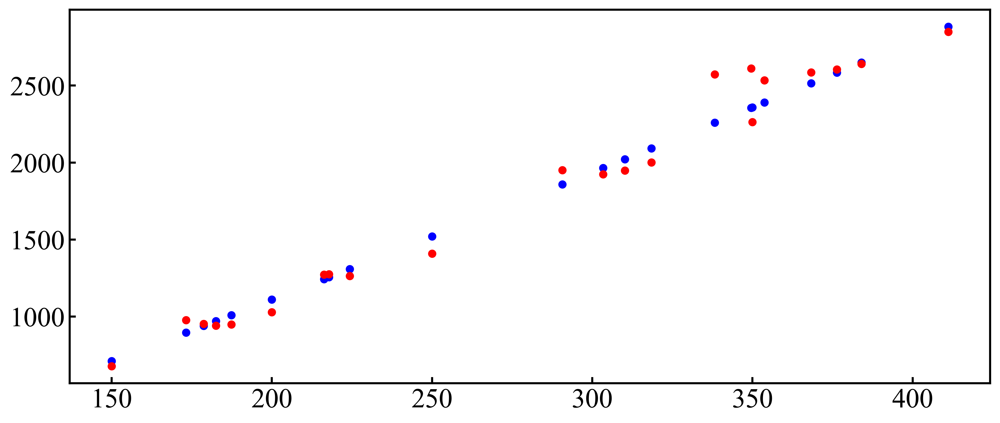

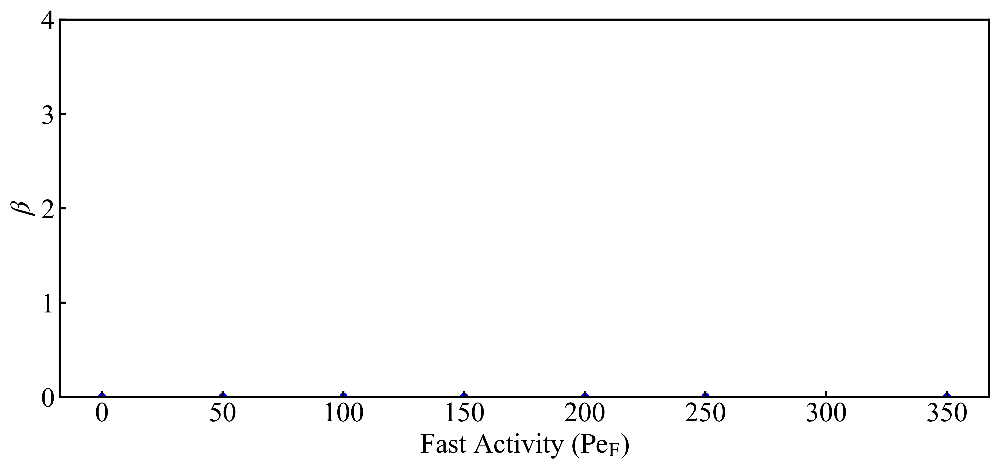

In [118]:
interpart_peA=np.array([])
interpart_peB=np.array([])
interpart_peNet=np.array([])
interpart_xA=np.array([])
interpart_eps=np.array([])
interpart_pnum=np.array([])
interpart_phi=np.array([])
interpart_press=np.array([])
interpart_press_expand=np.array([])


        
        
phase_peA=np.array([])
phase_peB=np.array([])
phase_peRat=np.array([])
phase_peDif=np.array([])
phase_peNet=np.array([])
phase_xA=np.array([])
phase_eps=np.array([])
phase_pnum=np.array([])
phase_phi=np.array([])
avg_bulk_nA = np.array([])
avg_bulk_nB = np.array([])
avg_int_nA = np.array([])
avg_int_nB = np.array([])
avg_gas_nA = np.array([])
avg_gas_nB = np.array([])
beta_arr = np.array([])
beta_peNet = np.array([])
avg_shear=np.array([])
bulk_lat_mean = np.array([])
beta_arr2 = np.array([])
int_lat_mean = np.array([])
all_lat_mean = np.array([])
beta_arr2_std = np.array([])

avg_bulk_nA = np.array([])
avg_bulk_nB = np.array([])
avg_bulk_n = np.array([])
avg_dense_nA = np.array([])
avg_dense_nB = np.array([])
avg_dense_n = np.array([])
avg_int_n = np.array([])

avg_int_nA = np.array([])
avg_int_nB = np.array([])
avg_gas_nA = np.array([])
avg_gas_nB = np.array([])
beta_final_arr=np.array([])
time_arr3 = np.array([])

def ljForce(r, eps, sigma=1.):
    div = (sigma/r)
    dU = (24. * eps / sigma) * ((2*(div**13)) - (div)**7)
    return dU

def avgCollisionForce(pe, power=1.):
    '''Computed from the integral of possible angles'''
    peCritical = 40.
    if pe < peCritical:
        pe = 0
    else:
        pe -= peCritical
    magnitude = 6.
    # A vector sum of the six nearest neighbors
    magnitude = np.sqrt(28)
#     return (magnitude * (pe**power)) / (np.pi)
#     return (pe * (1. + (8./(np.pi**2.))))
    coeff = 1.874#3.0#1.92#2.03#3.5#2.03
    #coeff= 0.4053
    return (pe * coeff)

def conForRClust(pe, eps):
    out = []
    r = 1.112
    skip = [0.1, 0.01, 0.001, 0.0001, 0.00001, 0.000001, 0.0000001, 0.00000001]
    for j in skip:
        while ljForce(r, eps) < avgCollisionForce(pe):
            r -= j
        r += j
    out = r
    return out
beta_test_arr = np.array([])
for n in range(0, len(all_pres_new)):
    if params3['peA'][n]!=450:
        time_arr3 = np.array([])
        bulk_nA_arr = np.array([])
        bulk_nB_arr = np.array([])
        bulk_n_arr = np.array([])
        int_n_arr = np.array([])
        int_nA_arr = np.array([])
        int_nB_arr = np.array([])
        gas_nA_arr = np.array([])
        gas_nB_arr = np.array([])
        dense_nA_arr = np.array([])
        dense_nB_arr = np.array([])
        dense_n_arr = np.array([])

        for j in range(0, len(all_pres_new[n]['clust_size'])):
            #if all_dens[i]['clust_size'][j]>=0.95*max_size:
                bin_size = all_pres_new[n]['sizeBin'][j]
                bin_area = bin_size**2
                time_arr3 = np.append(time_arr3, all_pres_new[n]['tauB'][j])
                bulk_nA_arr = np.append(bulk_nA_arr, all_pres_new[n]['Na_bulk'][j] / (bin_area * all_pres_new[n]['NBin_bulk'][j]))
                bulk_nB_arr = np.append(bulk_nB_arr, all_pres_new[n]['Nb_bulk'][j] / (bin_area * all_pres_new[n]['NBin_bulk'][j]))
                bulk_n_arr = np.append(bulk_n_arr, (all_pres_new[n]['Nb_bulk'][j]+all_pres_new[n]['Na_bulk'][j]) / (bin_area * all_pres_new[n]['NBin_bulk'][j]))
                int_n_arr = np.append(int_n_arr, (all_pres_new[n]['Na_int'][j]+all_pres_new[n]['Nb_int'][j]) / (bin_area * all_pres_new[n]['NBin_int'][j]))
                int_nA_arr = np.append(int_nA_arr, all_pres_new[n]['Na_int'][j] / (bin_area * all_pres_new[n]['NBin_int'][j]))
                int_nB_arr = np.append(int_nB_arr, all_pres_new[n]['Nb_int'][j] / (bin_area * all_pres_new[n]['NBin_int'][j]))
                gas_nA_arr = np.append(gas_nA_arr, all_pres_new[n]['Na_gas'][j] / (bin_area * all_pres_new[n]['NBin_gas'][j]))
                gas_nB_arr = np.append(gas_nB_arr, all_pres_new[n]['Nb_gas'][j] / (bin_area * all_pres_new[n]['NBin_gas'][j]))
                dense_n_arr = np.append(dense_n_arr, (all_pres_new[n]['Na_int'][j]+all_pres_new[n]['Nb_int'][j]+all_pres_new[n]['Na_bulk'][j]+all_pres_new[n]['Nb_bulk'][j]) / (bin_area * (all_pres_new[n]['NBin_int'][j]+all_pres_new[n]['NBin_bulk'][j])))
                dense_nA_arr = np.append(dense_nA_arr, (all_pres_new[n]['Na_int'][j]+all_pres_new[n]['Na_bulk'][j]) / (bin_area * (all_pres_new[n]['NBin_int'][j]+all_pres_new[n]['NBin_bulk'][j])))
                dense_nB_arr = np.append(dense_nB_arr, (all_pres_new[n]['Nb_int'][j]+all_pres_new[n]['Nb_bulk'][j]) / (bin_area * (all_pres_new[n]['NBin_int'][j]+all_pres_new[n]['NBin_bulk'][j])))

        for i in range(0, len(all_pres)):
            if params3['peA'][n]==params2['peA'][i]:
                if params3['peB'][n]==params2['peB'][i]:
                    bulk_press_total = 0
                    bulk_press_total_expand = 0
                    bulk_press_vals=0
                    time_arr = np.array([])
                    press_arr = np.array([])
                    shear_press_expand=0
                    # Don't plot non-phase-separated data
                    if all_pres[i].empty:
                            continue


                    max_size = np.amax(all_pres[i]['NDense'])
                    for j in range(0, len(all_pres[i]['NDense'])):
                        #if all_pres[i]['NDense'][j]>=0.95*max_size:

                            time_arr = np.append(time_arr, all_pres[i]['Timestep'][j])
                            bulk_trace = (all_pres[i]['bulkSigXX'].iloc[j]+all_pres[i]['bulkSigYY'].iloc[j])/2#+all_pres_new[i]['bulkSigYX'].iloc[-1]+all_pres_new[i]['bulkSigYY'].iloc[-1])/2
                            bulk_press = bulk_trace / (all_pres[i]['bulkArea'].iloc[j])

                            bulk_trace_expand = (all_pres[i]['bulkSigXX'].iloc[j]+all_pres[i]['bulkSigXY'].iloc[j]+all_pres[i]['bulkSigYX'].iloc[j]+all_pres[i]['bulkSigYY'].iloc[j])/2
                            bulk_press_expand = bulk_trace_expand / (all_pres[i]['bulkArea'].iloc[j])

                            shear_stress = (all_pres[i]['bulkSigXY'].iloc[j]+all_pres[i]['bulkSigYX'].iloc[j])/2
                            shear_press = shear_stress / (all_pres[i]['bulkArea'].iloc[j])
                            press_arr = np.append(press_arr, bulk_press/2)

                            if bulk_press > 0:
                                shear_press_expand +=shear_press
                                bulk_press_total += bulk_press
                                bulk_press_total_expand += bulk_press_expand
                                bulk_press_vals += 1
                    if bulk_press_vals > 0:        
                        avg_shear = np.append(avg_shear, shear_press_expand/bulk_press_vals)
                        avg_press = (bulk_press_total/(2*bulk_press_vals))
                        avg_press_expand = (bulk_press_total_expand/bulk_press_vals)
                        
                        interpart_press_expand=np.append(interpart_press_expand, avg_press_expand)
                        interpart_peA=np.append(interpart_peA, params2['peA'][i])
                        interpart_peB=np.append(interpart_peB, params2['peB'][i])
                        interpart_peNet=np.append(interpart_peNet, params2['peB'][i] * (1-params2['xA'][i]/100) + params2['peA'][i] * (params2['xA'][i]/100))
                        interpart_xA=np.append(interpart_xA, params2['xA'][i])
                        interpart_phi=np.append(interpart_phi, params2['phi'][i])
                        interpart_eps=np.append(interpart_eps, params2['eps'][i])

                    for k in range(0, len(all_pres_new2)):

                        # Don't plot non-phase-separated data
                        if all_pres_new2[k].empty:
                                continue

                        if params4['peA'][k]==params2['peA'][i]:
                            if params4['peB'][k]==params2['peB'][i]:
                                if params4['peA'][k]!=450:
                                    time_arr2 = np.array([])
                                    

                                    max_size = np.amax(all_pres_new2[k]['clust_size'])
                                    bulk_lat_arr = np.array([])
                                    int_lat_arr = np.array([])
                                    all_lat_arr = np.array([])

                                    for j in range(0, len(all_pres_new2[k]['clust_size'])):
                                        #if all_dens[i]['clust_size'][j]>=0.95*max_size:
                                            bin_size = all_pres_new2[k]['sizeBin'][j]
                                            bin_area = bin_size**2
                                            time_arr2 = np.append(time_arr2, all_pres_new2[k]['tauB'][j])
                                            bulk_lat_arr = np.append(bulk_lat_arr, all_pres_new2[k]['lat_mean_bulk'][j])
                                            all_lat_arr = np.append(all_lat_arr, all_pres_new2[k]['lat_mean_all'][j])
                                            int_lat_arr = np.append(int_lat_arr, all_pres_new2[k]['lat_mean_int'][j])
                                    time_ids = np.intersect1d(time_arr, time_arr2, return_indices=True)
                                    time_ids_press = time_ids[0].astype(int)
                                    time_ids_lat = time_ids[1].astype(int)
                                    
                                    '''
                                    fig, ax1 = plt.subplots(figsize=(12,5))
                                    plt.plot(time_arr2, bulk_lat_arr/np.max(bulk_lat_arr), '-', color='blue', label='Bulk',lw=1.8*1.8)
                                    plt.plot(time_arr2, int_lat_arr/np.max(int_lat_arr), '-', color='red', label='Interface',lw=1.8*1.8)
                                    # Set all the x ticks for radial plots
                                    loc = ticker.MultipleLocator(base=10)
                                    ax1.xaxis.set_major_locator(loc)
                                    loc = ticker.MultipleLocator(base=5)
                                    ax1.xaxis.set_minor_locator(loc)
                                   # Set y ticks
                                    loc = ticker.MultipleLocator(base=0.1)
                                    ax1.yaxis.set_major_locator(loc)
                                    loc = ticker.MultipleLocator(base=0.05)
                                    ax1.yaxis.set_minor_locator(loc)


                                    ax1.tick_params(axis='x', labelsize=26)
                                    ax1.tick_params(axis='y', labelsize=26)
                                    ax1.set_xlabel(r'Time ($x=\tau$)', fontsize=32)
                                    ax1.set_ylabel(r'Number Density ($n$)', fontsize=32)
                                    #ax1.set_ylim([-0.05,1.05])
                                    props = dict(boxstyle='square', facecolor='white', edgecolor='none', alpha=0.85, pad=0.1)
                                    #ax1.text(0.44, 0.88, r'$n(x)=(0.0023\mathrm{Pe}_\mathrm{Net}+1.0194)/(1+e^{18.8699(x-0.92902)})+(-0.000683\mathrm{Pe}_\mathrm{Net}+0.3534)$', zorder=10,
                                    #           transform=ax1.transAxes,
                                    #           fontsize=22,fontdict={'fontname':'Helvetica'}, bbox=props)  
                                    plt.legend(loc='upper right', fontsize=28)
                                    plt.tight_layout()
                                    plt.show()
                                    '''

                                    
                                    time_ids = np.intersect1d(time_ids_press, time_arr3, return_indices=True)
                                    time_ids_pres2 = time_ids[0].astype(int)
                                    time_ids_dens = time_ids[1].astype(int)
                                    #beta_plot = press_arr[time_ids_press][time_ids_pres2]/(2*np.sqrt(3)*(((dense_nA_arr[time_ids_dens]/dense_n_arr[time_ids_dens]) * phase_peA[-1] + (dense_nB_arr[time_ids_dens]/dense_n_arr[time_ids_dens]) * phase_peB[-1])-50)/bulk_lat_arr[time_ids_lat][time_ids_pres2])
                                    if np.max(time_ids_lat[time_ids_pres2])>150:
                                        interpart_press=np.append(interpart_press, avg_press)
                                        avg_bulk_nA = np.append(avg_bulk_nA, np.mean(bulk_nA_arr))
                                        avg_bulk_n = np.append(avg_bulk_n, np.mean(bulk_n_arr))
                                        avg_bulk_nB = np.append(avg_bulk_nB, np.mean(bulk_nB_arr))
                                        avg_int_n = np.append(avg_int_n, np.mean(int_n_arr))

                                        avg_int_nA = np.append(avg_int_nA, np.mean(int_nA_arr))
                                        avg_int_nB = np.append(avg_int_nB, np.mean(int_nB_arr))
                                        avg_gas_nA = np.append(avg_gas_nA, np.mean(gas_nA_arr))
                                        avg_gas_nB = np.append(avg_gas_nB, np.mean(gas_nB_arr))
                                        avg_dense_nA = np.append(avg_dense_nA, np.mean(dense_nA_arr))
                                        avg_dense_n = np.append(avg_dense_n, np.mean(dense_n_arr))
                                        avg_dense_nB = np.append(avg_dense_nB, np.mean(dense_nB_arr))

        
                                        bulk_lat_mean = np.append(bulk_lat_mean, np.mean(bulk_lat_arr))
                                        all_lat_mean = np.append(all_lat_mean, np.mean(all_lat_arr))
                                        int_lat_mean = np.append(int_lat_mean, np.mean(int_lat_arr))
                                    
                                        phase_peA=np.append(phase_peA, params4['peA'][k])
                                        phase_peB=np.append(phase_peB, params4['peB'][k])
                                        phase_peDif=np.append(phase_peDif, params4['peB'][k]-params4['peA'][k])
                                        phase_peRat=np.append(phase_peRat, params4['peA'][k]/params4['peB'][k])

                                        phase_peNet=np.append(phase_peNet, params4['peB'][k] * (1-params4['xA'][k]/100) + params4['peA'][k] * (params4['xA'][k]/100))
                                        phase_xA=np.append(phase_xA, params4['xA'][k])
                                        phase_phi=np.append(phase_phi, params4['phi'][k])
                                        phase_eps=np.append(phase_eps, params4['eps'][k])

                                        beta_plot = press_arr[time_ids_press][time_ids_pres2]/(2*np.sqrt(3)/bulk_lat_arr[time_ids_lat][time_ids_pres2])

                                        beta_test_arr = np.append(beta_test_arr, beta_plot[-1]) 
                                        #plt.plot(time_arr, press_arr/np.max(press_arr), '-', color='green', label='Press',lw=1.8*1.8)
                                        '''
                                        fig, ax1 = plt.subplots(figsize=(12,5))
                                        plt.plot(time_ids_lat[time_ids_pres2], beta_plot, '-', color='green', label='Press',lw=1.8*1.8)

                                        # Set all the x ticks for radial plots
                                        loc = ticker.MultipleLocator(base=10)
                                        ax1.xaxis.set_major_locator(loc)
                                        loc = ticker.MultipleLocator(base=5)
                                        ax1.xaxis.set_minor_locator(loc)
                                        # Set y ticks
                                        #loc = ticker.MultipleLocator(base=0.5)
                                        #ax1.yaxis.set_major_locator(loc)
                                        #loc = ticker.MultipleLocator(base=0.25)
                                        #ax1.yaxis.set_minor_locator(loc)


                                        ax1.tick_params(axis='x', labelsize=26)
                                        ax1.tick_params(axis='y', labelsize=26)
                                        ax1.set_xlabel(r'Time ($x=\tau$)', fontsize=32)
                                        ax1.set_ylabel(r'Number Density ($n$)', fontsize=32)
                                        #ax1.set_ylim([-0.05,1.05])
                                        props = dict(boxstyle='square', facecolor='white', edgecolor='none', alpha=0.85, pad=0.1)
                                        #ax1.text(0.44, 0.88, r'$n(x)=(0.0023\mathrm{Pe}_\mathrm{Net}+1.0194)/(1+e^{18.8699(x-0.92902)})+(-0.000683\mathrm{Pe}_\mathrm{Net}+0.3534)$', zorder=10,
                                        #           transform=ax1.transAxes,
                                        #           fontsize=22,fontdict={'fontname':'Helvetica'}, bbox=props)  
                                        plt.legend(loc='upper right', fontsize=28)
                                        plt.tight_layout()
                                        plt.show()
                                        '''

                                        beta2 = ((24/phase_peB[-1]) * (2*(1.0/bulk_lat_arr)**13 - (1.0/bulk_lat_arr)**7))
                                        print(np.mean(beta2))
                                        ymin = np.mean(beta2)-1
                                        ymax=np.mean(beta2)+1
                                        '''
                                        fig, ax1 = plt.subplots(figsize=(12,5))

                                        x_arr = np.array([0, 200])
                                        y_arr = np.ones(2)
                                        lat_theory = np.zeros(len(time_arr3))
                                        for p in range(0, len(time_arr3)):
                                            lat_theory[p] = conForRClust((((dense_nA_arr[p]/dense_n_arr[p]) * phase_peA[-1] + (dense_nB_arr[p]/dense_n_arr[p]) * phase_peB[-1])), 1.0)
                                            #lat_theory[p] = getLat(phase_peB[-1], 1.0)
                                        #y_arr_now = np.ones(2) * lat_theory
                                        print(params2['peA'][i])
                                        print(params2['peB'][i])
                                        plt.plot(time_arr2, bulk_lat_arr, '-', linewidth=1.8*1.8, color='blue', label='Simulation')
                                        plt.plot(time_arr3, lat_theory, '--', linewidth=1.8*1.8, color='black', label='Theory')
                                        #plt.plot(x_arr, y_arr, '--', color='black', lw=1.8*1.8)
                                        #plt.plot(x_arr, y_arr2, '--', color='green', lw=1.8*1.8)
                                        # Set all the x ticks for radial plots
                                        loc = ticker.MultipleLocator(base=20)
                                        ax1.xaxis.set_major_locator(loc)
                                        loc = ticker.MultipleLocator(base=10)
                                        ax1.xaxis.set_minor_locator(loc)
                                       # Set y ticks
                                        #loc = ticker.MultipleLocator(base=0.2)
                                        #ax1.yaxis.set_major_locator(loc)
                                        #loc = ticker.MultipleLocator(base=0.1)
                                        #ax1.yaxis.set_minor_locator(loc)


                                        ax1.tick_params(axis='x', labelsize=26)
                                        ax1.tick_params(axis='y', labelsize=26)
                                        ax1.set_xlabel(r'Time ($\tau$)', fontsize=32)
                                        ax1.set_ylabel(r'lattice spacing ($a$)', fontsize=32)
                                        #ax1.set_ylim([-0.05,1.05])
                                        props = dict(boxstyle='square', facecolor='white', edgecolor='none', alpha=0.85, pad=0.1)
                                        #ax1.text(0.44, 0.88, r'$n(x)=(0.0023\mathrm{Pe}_\mathrm{Net}+1.0194)/(1+e^{18.8699(x-0.92902)})+(-0.000683\mathrm{Pe}_\mathrm{Net}+0.3534)$', zorder=10,
                                        #           transform=ax1.transAxes,
                                        #           fontsize=22,fontdict={'fontname':'Helvetica'}, bbox=props)  
                                        plt.legend(loc='lower right', fontsize=22)
                                        ax1.set_ylim([0,1.0])
                                        ax1.set_xlim([0, 200])
                                        #plt.ylim([ymin,ymax])
                                        plt.tight_layout()
                                        plt.show()
                                        '''
                                        xy, x_ind, y_ind = np.intersect1d(time_arr2, time_arr3, return_indices=True)
                                        #x_test = (((dense_nA_arr[y_ind]/dense_n_arr[y_ind]) * phase_peA[-1] + (dense_nB_arr[y_ind]/dense_n_arr[y_ind]) * phase_peB[-1])-50)/bulk_lat_arr[x_ind]
                                        x_test = (((int_nA_arr[y_ind]/int_n_arr[y_ind]) * phase_peA[-1] + (int_nB_arr[y_ind]/int_n_arr[y_ind]) * phase_peB[-1])-50)/bulk_lat_arr[x_ind]
                                        from scipy.optimize import curve_fit
                                        def func(x, m):
                                            return   x * 2.0 * m *np.sqrt(3)

                                        xy2, x_ind2, y_ind2 = np.intersect1d(time_arr2[x_ind], time_arr, return_indices=True)

                                        popt, pcov = curve_fit(func, x_test, press_arr[y_ind2])
                                        beta_final_arr = np.append(beta_final_arr, popt[0])
                                        '''
                                        fig, ax1 = plt.subplots(figsize=(12,5))

                                        x_arr = np.array([0, 200])
                                        y_arr = np.ones(2)
                                        print(params2['peA'][i])
                                        print(params2['peB'][i])
                                        plt.plot(time_arr, press_arr, '-', color='green', label='Simulation',lw=1.8*1.8)
                                        #plt.plot(time_arr2, beta2/np.mean(beta2), '-', color='purple', label=r'$\Pi_\mathrm{d}$',lw=1.8*1.8)
                                        plt.plot(time_arr2[x_ind], func(x_test, *popt), '-', linewidth=1.8*1.8, color='blue', label='Theory')
                                        #plt.plot(x_arr, y_arr, '--', color='black', lw=1.8*1.8)
                                        #plt.plot(x_arr, y_arr2, '--', color='green', lw=1.8*1.8)
                                        # Set all the x ticks for radial plots
                                        loc = ticker.MultipleLocator(base=20)
                                        ax1.xaxis.set_major_locator(loc)
                                        loc = ticker.MultipleLocator(base=10)
                                        ax1.xaxis.set_minor_locator(loc)
                                       # Set y ticks
                                        #loc = ticker.MultipleLocator(base=0.2)
                                        #ax1.yaxis.set_major_locator(loc)
                                        #loc = ticker.MultipleLocator(base=0.1)
                                        #ax1.yaxis.set_minor_locator(loc)


                                        ax1.tick_params(axis='x', labelsize=26)
                                        ax1.tick_params(axis='y', labelsize=26)
                                        ax1.set_xlabel(r'Time ($\tau$)', fontsize=32)
                                        ax1.set_ylabel(r'$\Pi_\mathrm{d}$', fontsize=32)
                                        #ax1.set_ylim([-0.05,1.05])
                                        props = dict(boxstyle='square', facecolor='white', edgecolor='none', alpha=0.85, pad=0.1)
                                        #ax1.text(0.44, 0.88, r'$n(x)=(0.0023\mathrm{Pe}_\mathrm{Net}+1.0194)/(1+e^{18.8699(x-0.92902)})+(-0.000683\mathrm{Pe}_\mathrm{Net}+0.3534)$', zorder=10,
                                        #           transform=ax1.transAxes,
                                        #           fontsize=22,fontdict={'fontname':'Helvetica'}, bbox=props)  
                                        plt.legend(loc='upper right', fontsize=22)
                                        #ax1.set_ylim([0,1.4])
                                        ax1.set_xlim([0, 200])
                                        #plt.ylim([ymin,ymax])
                                        plt.tight_layout()
                                        plt.show()
                                        
                                        fig, ax1 = plt.subplots(figsize=(12,5))

                                        x_arr = np.array([0, 200])
                                        y_arr = np.ones(2)
                                        print(params2['peA'][i])
                                        print(params2['peB'][i])
                                        #plt.plot(time_arr2, beta2/np.mean(beta2), '-', color='purple', label=r'$\Pi_\mathrm{d}$',lw=1.8*1.8)
                                        plt.plot(time_arr2[x_ind], (((int_nA_arr[y_ind]/int_n_arr[y_ind]) * phase_peA[-1] + (int_nB_arr[y_ind]/int_n_arr[y_ind]) * phase_peB[-1])-50), '-', linewidth=1.8*1.8, color='blue', label='Theory')
                                        #plt.plot(x_arr, y_arr, '--', color='black', lw=1.8*1.8)
                                        #plt.plot(x_arr, y_arr2, '--', color='green', lw=1.8*1.8)
                                        # Set all the x ticks for radial plots
                                        loc = ticker.MultipleLocator(base=20)
                                        ax1.xaxis.set_major_locator(loc)
                                        loc = ticker.MultipleLocator(base=10)
                                        ax1.xaxis.set_minor_locator(loc)
                                       # Set y ticks
                                        #loc = ticker.MultipleLocator(base=0.2)
                                        #ax1.yaxis.set_major_locator(loc)
                                        #loc = ticker.MultipleLocator(base=0.1)
                                        #ax1.yaxis.set_minor_locator(loc)


                                        ax1.tick_params(axis='x', labelsize=26)
                                        ax1.tick_params(axis='y', labelsize=26)
                                        ax1.set_xlabel(r'Time ($\tau$)', fontsize=32)
                                        ax1.set_ylabel(r'$\mathrm{Pe}_\mathrm{int}$', fontsize=32)
                                        #ax1.set_ylim([-0.05,1.05])
                                        props = dict(boxstyle='square', facecolor='white', edgecolor='none', alpha=0.85, pad=0.1)
                                        #ax1.text(0.44, 0.88, r'$n(x)=(0.0023\mathrm{Pe}_\mathrm{Net}+1.0194)/(1+e^{18.8699(x-0.92902)})+(-0.000683\mathrm{Pe}_\mathrm{Net}+0.3534)$', zorder=10,
                                        #           transform=ax1.transAxes,
                                        #           fontsize=22,fontdict={'fontname':'Helvetica'}, bbox=props)  
                                        plt.legend(loc='upper right', fontsize=22)
                                        ax1.set_ylim([0,500])
                                        ax1.set_xlim([0, 200])
                                        #plt.ylim([ymin,ymax])
                                        plt.tight_layout()
                                        plt.show()
                                        '''

                                        beta_arr = np.append(beta_arr, interpart_press[-1]/(2*np.sqrt(3)*interpart_peNet[-1]/bulk_lat_mean[-1]))
                                        beta_arr2 = np.append(beta_arr2, np.mean(beta2))
                                        std_sum = 0
                                        std_num =0
                                        for o in range(0, len(bulk_lat_arr)):
                                            std_sum +=(bulk_lat_arr[o]-bulk_lat_mean[-1])**2
                                            std_num +=1

                                        beta_arr2_std = np.append(beta_arr2_std, (std_sum/std_num)**0.5)
                                        beta_peNet=np.append(beta_peNet, params4['peB'][k] * (1-params4['xA'][k]/100) + params4['peA'][k] * (params4['xA'][k]/100))

fig, ax1 = plt.subplots(figsize=(12,5))
plt.scatter(phase_peB, beta_test_arr, color=green, s=25.0, label='Fast Activity')
plt.ylabel(r'$\beta F^a$')
plt.xlabel(r'Fast Activity ($\mathrm{Pe}_\mathrm{F}$)')
#plt.scatter((((avg_bulk_nA/avg_bulk_n) * phase_peA + (avg_bulk_nB/avg_bulk_n) * phase_peB)), beta_test_arr, color=green, s=25.0, label='bulk')
plt.legend(loc='upper left')
#ax1.set_ylim([0.0,1.0])
plt.show()
lat_theory_mean_int = np.zeros(len(phase_peNet))
lat_theory_mean_bulk = np.zeros(len(phase_peNet))

lat_theory_mean_dense = np.zeros(len(phase_peNet))

dense_pe_net = np.zeros(len(phase_peNet))
bulk_pe_net = np.zeros(len(phase_peNet))
int_pe_net = np.zeros(len(phase_peNet))

beta_theory = np.zeros(len(phase_peNet))
beta_theory2 = np.zeros(len(phase_peNet))

beta_theory3 = np.zeros(len(phase_peNet))
beta_theory4 = np.zeros(len(phase_peNet))
press_theory = np.zeros(len(phase_peNet))
div = (1.0/bulk_lat_mean)
dU = (24.) * ((2*(div**13)) - (div)**7)
for p in range(0, len(phase_peNet)):
    dense_pe_net[p]=(((avg_dense_nA[p]/avg_dense_n[p]) * phase_peA[p] + (avg_dense_nB[p]/avg_dense_n[p]) * phase_peB[p]))
    bulk_pe_net[p]=((avg_bulk_nA[p]/avg_bulk_n[p]) * phase_peA[p] + (avg_bulk_nB[p]/avg_bulk_n[p]) * phase_peB[p])
    int_pe_net[p]=(((avg_int_nA[p]/avg_int_n[p]) * phase_peA[p] + (avg_int_nB[p]/avg_int_n[p]) * phase_peB[p]))
    lat_theory_mean_int[p] = conForRClust(int_pe_net[p]-50, 1.0)

    press_theory[p] = (int_pe_net[p]-50) * 2 * np.sqrt(3) * 1.874/lat_theory_mean_int[p]
fig, ax1 = plt.subplots(figsize=(12,5))
plt.scatter(int_pe_net, press_theory, color='blue', s=25.0)
plt.scatter(int_pe_net, interpart_press, color='red', s=25.0)
plt.ylabel(r'$\Pi_\mathrm{d}$')
plt.xlabel(r'Fast Activity ($\mathrm{Pe}_\mathrm{F}$)')
#ax1.set_ylim([0.0,1.0])
plt.show()

fig, ax1 = plt.subplots(figsize=(12,5))
plt.scatter(phase_peA, beta_theory, color='blue', s=25.0)
plt.ylabel(r'$\beta$')
plt.xlabel(r'Fast Activity ($\mathrm{Pe}_\mathrm{F}$)')
plt.ylim([0,4.0])

plt.show()


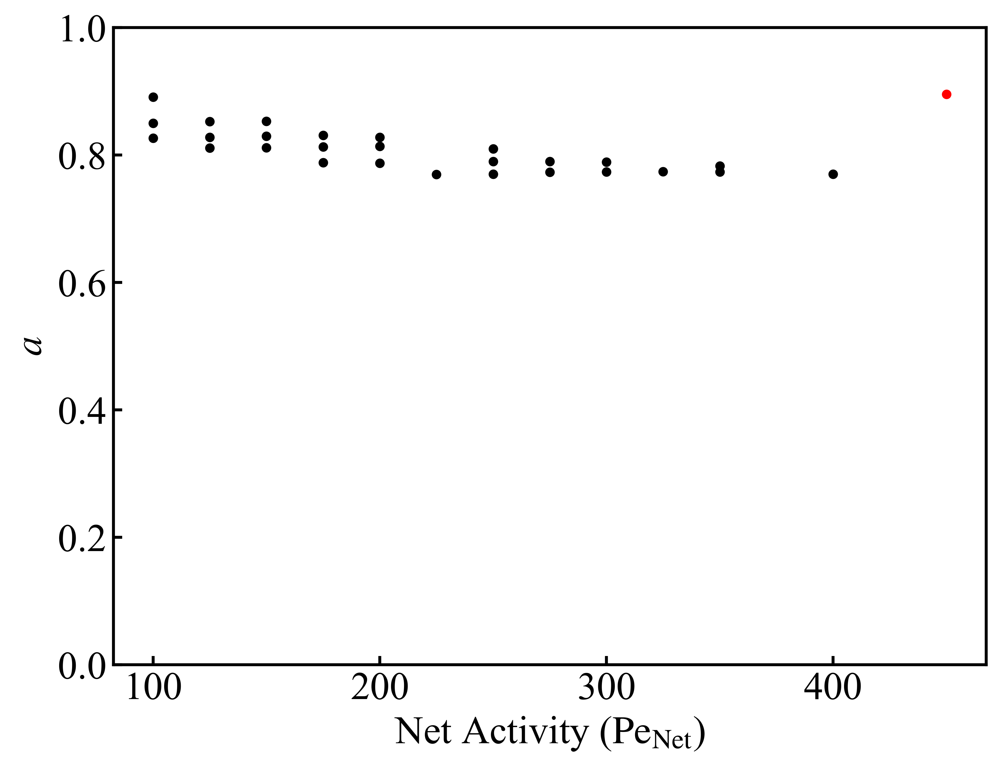

IndexError: index 0 is out of bounds for axis 0 with size 0

In [21]:
plt.figure(figsize=(8,6))
plt.scatter(phase_peNet, bulk_lat_mean, s=15.0, color='black')
plt.scatter(450, ((np.pi/(2*np.sqrt(3)))/(1.440*(np.pi/4)))**0.5, s=15.0, color='red')
#plt.scatter(phase_peNet, (3.*np.sqrt(3)*phase_peB)/interpart_press, s=15.0, color='green')

plt.ylabel(r'$a$')
plt.ylim([0,1.0])
plt.xlabel(r'Net Activity ($\mathrm{Pe}_\mathrm{Net}$)')

plt.show()
remove = np.where((phase_peNet!=450))[0]

from scipy.optimize import curve_fit
def func(x, m, b):
    return m * x + b

popt, pcov = curve_fit(func, phase_peDif[remove], beta_final_arr[remove])
print(popt)
plt.figure(figsize=(8,6))
plt.scatter(phase_peDif[remove], beta_final_arr[remove], s=15.0, color='black')
plt.plot(phase_peDif[remove], func(phase_peDif[remove], *popt), '-', color='black', linewidth=1.8*1.8, label=r'$\beta=1.69 + \mathrm{Pe}_\mathrm{Dif}\times 4.788E-4$')

#plt.scatter(450, ((np.pi/(2*np.sqrt(3)))/(1.440*(np.pi/4)))**0.5, s=15.0, color='red')
#plt.scatter(phase_peNet, (3.*np.sqrt(3)*phase_peB)/interpart_press, s=15.0, color='green')

plt.ylabel(r'$\beta$')
plt.ylim([0,2.0])
plt.xlabel(r'Activity Difference ($\mathrm{Pe}_\mathrm{Fast}-\mathrm{Pe}_\mathrm{Slow}$)')

plt.show()
remove = np.where((phase_peDif==0) & (phase_peNet!=450))[0]
#beta = ((24/beta_peNet) * (2*(1.0/bulk_lat_mean)**13 - (1.0/bulk_lat_mean)**7))


test = np.where(phase_peA == phase_peB)[0]


from scipy.optimize import curve_fit
def func(x, m, b):
    return m * x + b

remove = np.where((phase_peNet!=450))[0]


popt, pcov = curve_fit(func, phase_peB[remove], beta_arr2[remove])
print(popt)
print(170/3.2)
fig, ax1 = plt.subplots(figsize=(8,6))
plt.scatter(phase_peB[remove], beta_arr2[remove], s=50, edgecolor='black', facecolor='none')
plt.plot(phase_peB[remove], func(phase_peB[remove], *popt), '-', color='black', linewidth=1.8*1.8, label=r'$\beta F^a=3.2(\mathrm{Pe}_\mathrm{Fast}-53)$')
plt.ylabel(r'$\beta$')
plt.xlabel(r'Fast Activity ($\mathrm{Pe}_\mathrm{F}$)')

loc = ticker.MultipleLocator(base=50)
ax1.xaxis.set_major_locator(loc)
loc = ticker.MultipleLocator(base=25)
ax1.xaxis.set_minor_locator(loc)
# Set y ticks
loc = ticker.MultipleLocator(base=200)
ax1.yaxis.set_major_locator(loc)
loc = ticker.MultipleLocator(base=100)
ax1.yaxis.set_minor_locator(loc)


ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
ax1.set_xlabel(r'Fast Activity ($\mathrm{Pe}_\mathrm{Fast}$)', fontsize=32)
ax1.set_ylabel(r'$\beta F^a$', fontsize=32)
plt.legend(loc='upper left', fontsize=28)

plt.ylim([0, 1400])
plt.xlim([75, 475])
                            
plt.show()


remove = np.where((phase_peNet!=450))[0]


popt, pcov = curve_fit(func, phase_peB[remove], interpart_press[remove])
print(popt)
fig, ax1 = plt.subplots(figsize=(8,6))
plt.scatter(phase_peB[remove], interpart_press[remove], s=50, edgecolor='black', facecolor='none')
plt.plot(phase_peB[remove], func(phase_peB[remove], *popt), '-', color='black', linewidth=1.8*1.8, label=r'$\beta F^a=3.2\mathrm{Pe}_\mathrm{Fast}-170$')
plt.scatter(phase_peB[remove], 4*np.sqrt(3)*phase_peNet[remove]/bulk_lat_mean[remove], s=50, color='red')

loc = ticker.MultipleLocator(base=50)
ax1.xaxis.set_major_locator(loc)
loc = ticker.MultipleLocator(base=25)
ax1.xaxis.set_minor_locator(loc)
# Set y ticks
loc = ticker.MultipleLocator(base=200)
ax1.yaxis.set_major_locator(loc)
loc = ticker.MultipleLocator(base=100)
ax1.yaxis.set_minor_locator(loc)


ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
ax1.set_xlabel(r'Net Activity ($\mathrm{Pe}_\mathrm{Net}$)', fontsize=32)
ax1.set_ylabel(r'$\Pi_\mathrm{d}$', fontsize=32)
plt.legend(loc='upper left', fontsize=28)

#plt.ylim([0, 1400])
plt.xlim([75, 475])
                            
plt.show()





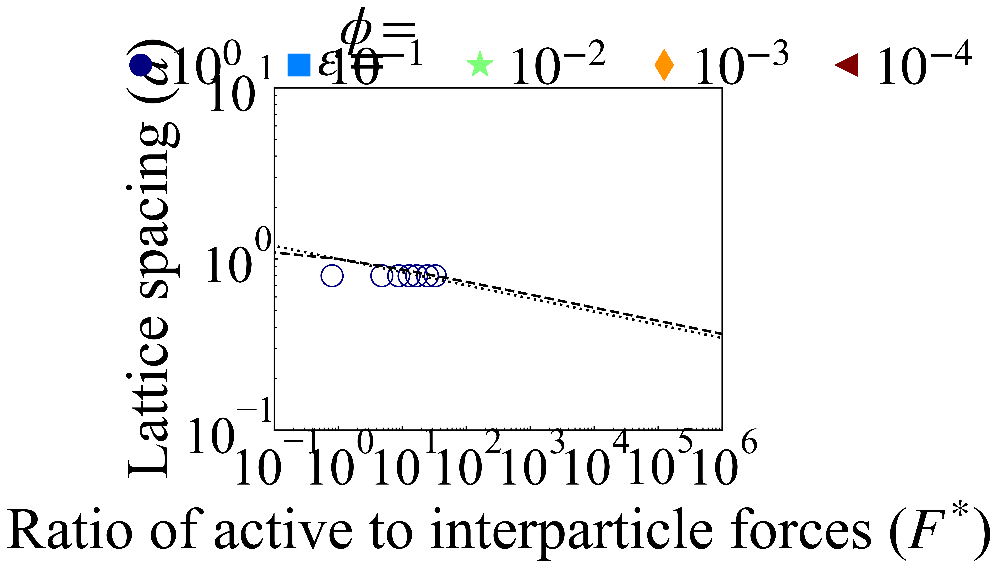

In [61]:
def avgCollisionForce(pe, power=1.):
    '''Computed from the integral of possible angles'''
    peCritical = 40.
    if pe < peCritical:
        pe = 0
    else:
        pe -= peCritical
    magnitude = 6.
    # A vector sum of the six nearest neighbors
    magnitude = np.sqrt(28)
#     return (magnitude * (pe**power)) / (np.pi)
#     return (pe * (1. + (8./(np.pi**2.))))
    coeff = 1.92#2.03#3.5#2.03
    #coeff= 0.4053
    return (pe * coeff)
myEps = [1., 0.1, 0.01, 0.001, 0.0001]
mkEps = ['o', 's', '*', 'd', '<']

def fStar(pe, epsilon, sigma=1.):
    out = (avgCollisionForce(pe) * sigma) / (24.*epsilon)
    return out
# From area fraction, get lattice spacing
def phiToLat(phiIn):
    '''Read in phi, output the lattice spacing'''
    phiCP = np.pi / (2. * np.sqrt(3.))
    latCP = 1.
    return np.sqrt(phiCP / phiIn)
mk='s'
import matplotlib.ticker
from matplotlib import pyplot
med = 1.5
msz = 80.
phiVal = [0.65, 0.55, 0.45]
phiLS = ['-.', ':', '--']
phi_leg = []
for i in range(0, len(phiVal)):
    phi_leg.append(Line2D([0], [0], lw=med, c='k', 
                          markeredgecolor='none', label=phiVal[i], 
                          markerfacecolor='none', markersize=msz, 
                          ls=phiLS[i]))

eps_leg=[]
mkSz = [0.8, 0.8, 1.0, 0.8, 0.8]
msz=10
for i in range(0, len(myEps)):
#     eps_leg.append(Line2D([0], [0], lw=0., marker=mk, markeredgewidth=med,
#                           markeredgecolor=plt.cm.jet((np.log10(myEps[i]) + 4)/ (len(myEps)-1) ),
#                           markerfacecolor=plt.cm.jet((np.log10(myEps[i]) + 4)/ (len(myEps)-1) ),
#                           label=r'$10^{{{}}}$'.format(-i), markersize=msz))
    eps_leg.append(Line2D([0], [0], lw=0., marker=mkEps[i], markeredgewidth=med,
                          markeredgecolor=plt.cm.jet(float(i)/ (len(myEps)-1) ),
                          markerfacecolor=plt.cm.jet(float(i)/ (len(myEps)-1) ),
                          label=r'$10^{{{}}}$'.format(-i), markersize=(3.2*msz * mkSz[i])))

patterns = ['+++', 'xxx', 'ooo']
mkSz = [1.2, 1.0, 2.3, 1.2, 1.2]
GAS="Gas-r=5.0"
LIQ="Liq-r=5.0"

fig = plt.figure(figsize=(11, 10))

# The parent gridspec
#gs = gridspec.GridSpec(1, 1, height_ratios=[1,1], figure=fig)
bsSz = 60.

# A more familiar form
ax = []
ax.append(fig.add_subplot())
#ax.append(fig.add_subplot(gs[0]))
#ax.append(fig.add_subplot(gs[1]))

ax[0].text(0.095, 1.03825, r'$\epsilon=$',
           transform=ax[0].transAxes,
           fontsize=fsize*3.2)
one_leg = ax[0].legend(handles=eps_leg, loc='center',
             columnspacing=0.08, handletextpad=-0.5,
             bbox_transform=ax[0].transAxes, bbox_to_anchor=[0.57, 1.05],
             fontsize=fsize*3.2, frameon=False, ncol=5)
ax[0].add_artist(one_leg)

#ax[0].text(0.02, 0.92, r'$(a)$', zorder=10,
#           transform=ax[0].transAxes,
#           fontsize=fsize*3.0)

# Add axes for the fstar plot
# Now add inset w/ text

# Plot fstar
#ax[0].plot(fstarRange, fstarLat, ls='-.', c='k', linewidth=1.5*2.0)

def fit(x, *a):
    ret=a[0]*(x**a[1])
    return ret

# Overlay the simulation data
x_plot = np.array([10**(-3), 10**(-2), 10**(-1), 10**0, 10**1, 10**2, 10**3, 10**4, 10**5, 10**6, 10**7, 10**8])

x_fit = np.array([])
ax[0].plot(fstarRange, fstarLat, ls='--', c='k', linewidth=1.5*2.0)
y_fit = np.array([])
for i in range(0, len(all_pres_new)):
    # Don't plot non-phase-separated data

    x_fit = np.append(x_fit, fStar(params3['peA'][i], params3['eps'][i]))
    y_fit = np.append(y_fit, phiToLat(((all_pres_new[k]['Nb_bulk'][j]+all_pres_new[k]['Na_bulk'][j]) / (bin_area * all_pres_new[k]['NBin_bulk'][j]))*(np.pi/4)))
    ax[0].scatter(fStar(params['peA'][i], params['eps'][i]), phiToLat(((all_pres_new[k]['Nb_bulk'][j]+all_pres_new[k]['Na_bulk'][j]) / (bin_area * all_pres_new[k]['NBin_bulk'][j]))*(np.pi/4)), facecolors='None',
                  edgecolors=plt.cm.jet(float(epsRange.index(params['eps'][i]))/(len(epsRange)-1)),
                  s=msz*55*mkSz[0], linewidth=1.2*med,
                  marker=mkEps[0])

#popt, pcov = curve_fit(fit, x_fit, y_fit, [1.0] *2)  
y_fit = ((2.0/2)*x_plot)**(-1/13)
ax[0].plot(x_plot, y_fit, ls='dotted', c='k', linewidth=1.5*2.0)   
# plt.xlim(0, 100000)
ax[0].set_xlim(5,10**6)
ax[0].set_ylim(0.3, 1.)

#ax[0].text(0.49, 0.545, r'$y=1.051x^{-0.078}$',
#           transform=ax[0].transAxes,
#           fontsize=fsize*3.2)

#mpl.rc('font', serif='dejavuserif')
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams["font.family"] = "Times New Roman"
#rcParams['font.family'] = 'sans-serif'
ax[0].set_ylabel(r"Lattice spacing ($\mathit{a}$)", fontsize=fsize*3.5)

mpl.rc('font', serif='cm')
ax[0].set_xscale('log')
ax[0].set_yscale('log')
# Set minor ticks
#loc = ticker.MultipleLocator(base=0.125)
#ax[0].yaxis.set_minor_locator(loc)
#loc = ticker.MultipleLocator(base=0.25)
#ax[0].yaxis.set_major_locator(loc)

ax[0].set_xlim([10**(-1), 10**6])
ax[0].set_ylim([10**(-1), 10**1])
locmaj = matplotlib.ticker.LogLocator(base=10.0, numticks=8)
ax[0].xaxis.set_major_locator(locmaj)

locmin = matplotlib.ticker.LogLocator(base=10.0,subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9),numticks=9)
ax[0].xaxis.set_minor_locator(locmin)
ax[0].xaxis.set_minor_formatter(matplotlib.ticker.NullFormatter())

locmaj = matplotlib.ticker.LogLocator(base=10.0, numticks=6)
ax[0].yaxis.set_major_locator(locmaj)

locmin = matplotlib.ticker.LogLocator(base=10.0,subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9),numticks=12)
ax[0].yaxis.set_minor_locator(locmin)
ax[0].yaxis.set_minor_formatter(matplotlib.ticker.NullFormatter())

ax[0].text(0.145, 1.13, r'$\phi=$',
           transform=ax[0].transAxes,
           fontsize=fsize*3.2)


#ax[0].text(0.5, 0.545, r'$r^2=$'+str(round(Rsquared, 4)),
#           transform=ax[0].transAxes,
#           fontsize=fsize*3.2)
ax[0].tick_params(axis='x', labelsize=fsize*3.1, pad=10)
ax[0].tick_params(axis='y', labelsize=fsize*3.1)
ax[0].set_xlabel(r'Ratio of active to interparticle forces ($F^{*}$)', fontsize=fsize*3.5)

plt.tight_layout()
#plt.savefig('beta_fit2.png', pad_inches=0.0, dpi=500)
plt.show()